In [1]:
import numpy as np
import read_lif as lif
from skimage.registration import phase_cross_correlation
from skimage.filters import threshold_otsu, threshold_li
from skimage.measure import profile_line
from scipy.ndimage import gaussian_filter, gaussian_filter1d, uniform_filter, grey_dilation, binary_opening, binary_dilation
from scipy.spatial import Voronoi, Delaunay, cKDTree as KDTree
from scipy.interpolate import griddata
import texture
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
from importlib import reload
%matplotlib inline

In [2]:
cd ~/Documents/Akash/20200221/20200221_3/

/data/mleocmach/Documents/Akash/20200221/20200221_3


In [3]:
rea = lif.Reader("../20200221/20200221_3_constant_stress_CAS1.lif", False)
#ser = rea.chooseSerie()
ser = rea.getSeries()[2]
px = np.asarray([ser.getVoxelSize(d+1)*1e6 for d in range(3)])

We know from `characteristic_length.ipynb` that the characteristic correlation length of this gel is something aroung 20-40px in plane.

In [4]:
px[-1]/px[0], ((2*np.arange(1,10)+1)*px[-1]/px[0]-1)/2

(2.2126570379523858,
 array([ 2.81898556,  5.03164259,  7.24429963,  9.45695667, 11.66961371,
        13.88227075, 16.09492778, 18.30758482, 20.52024186]))

# Real 2D images, detail

In [5]:
ims = [ser.get2DSlice(T=38+i, Z=30).astype(float)[200:328,0:128] for i in range(2)]

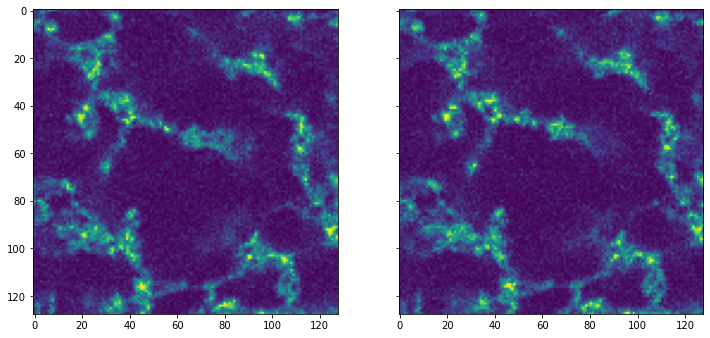

In [6]:
fig, axs = plt.subplots(1,2, figsize=(12,6), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
for im, ax in zip(ims, axs):
    ax.imshow(im)

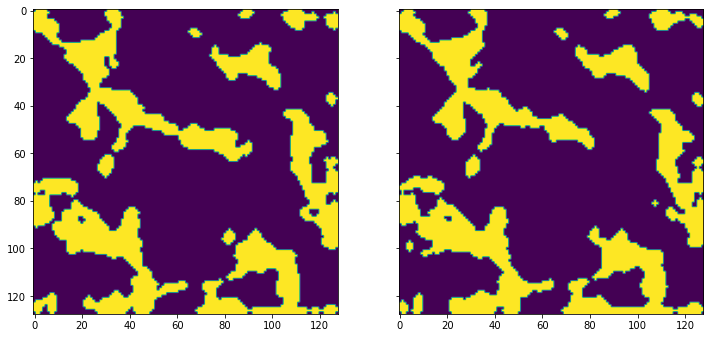

In [7]:
blur = gaussian_filter(ims[0], 1.)
threshold = threshold_li(blur)
#thresholdeds = [gaussian_filter(im, 1)>threshold for im in ims]#
thresholdeds = [binary_opening(gaussian_filter(im, 1)>threshold) for im in ims]
fig, axs = plt.subplots(1,2, figsize=(12,6), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
for im, ax in zip(thresholdeds, axs):
    ax.imshow(im)

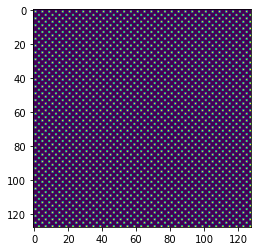

In [8]:
period = 4
gridcell = np.vstack((
    (np.arange(period)==period-1)[None,:,None] & (np.arange(period)==period-1)[None,None,:],
    (np.arange(period)==period//2-1)[None,:,None] & (np.arange(period)==period//2-1)[None,None,:]
))
grid2D = np.tile(np.any(gridcell,0), np.array(ims[0].shape)//period)
plt.imshow(grid2D)

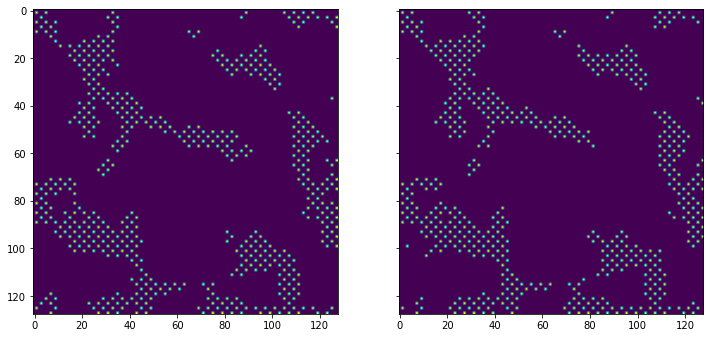

In [9]:
fig, axs = plt.subplots(1,2, figsize=(12,6), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
for thresholded, ax in zip(thresholdeds, axs):
    ax.imshow(thresholded & grid2D)

We will consider a window of `2radius+1` around each point of interest. `radius=7` is good for our images. 4, 5 or 6 is too small (noisy result).

(405, 2)


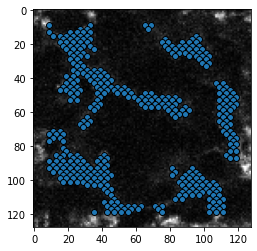

In [10]:
radius = 8
nomargin = grid2D&thresholdeds[0]
nomargin[:radius] = False
nomargin[-radius:] = False
nomargin[:,:radius] = False
nomargin[:,-radius:] = False
pts = np.column_stack(np.where(nomargin))
print(pts.shape)
plt.imshow(ims[0], 'gray')
plt.scatter(pts[:,1], pts[:,0], cmap='coolwarm', edgecolors='k')

In [11]:
d = np.zeros(pts.shape)
blurs = [gaussian_filter(im, 0.5) for im in ims]
error = np.zeros(pts.shape[0])
for u,(i,j) in enumerate(pts):
    d[u], error[u], trash = phase_cross_correlation(blurs[1][i-radius:i+radius+1, j-radius:j+radius+1], blurs[0][i-radius:i+radius+1, j-radius:j+radius+1], upsample_factor=10)
print(d.min(), d.max())

-3.7 1.6


Remove points that have moved outside of the thresholded regions in the next frame

0.8740740740740741

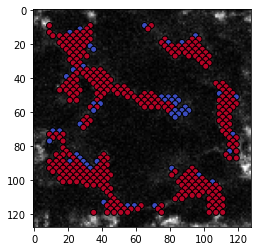

In [12]:
nextpts = pts+d
stillin = thresholdeds[1][nextpts[:,0].astype(int), nextpts[:,1].astype(int)]
plt.imshow(ims[0], 'gray')
plt.scatter(pts[:,1], pts[:,0],c=stillin, cmap='coolwarm', edgecolors='k')
goodpoints = [pts[stillin], nextpts[stillin]]
stillin.mean()

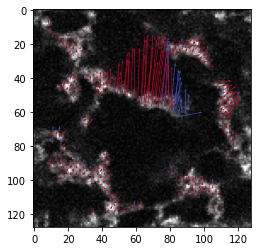

In [13]:
#plt.quiver(pts[:,1], pts[:,0], d[:,1], -d[:,0], np.sum(d**2, 1), units='xy')
plt.quiver(pts[:,1], pts[:,0], d[:,1], -d[:,0], stillin, units='xy', cmap='coolwarm', scale=0.1)
plt.imshow(ims[0], "gray")

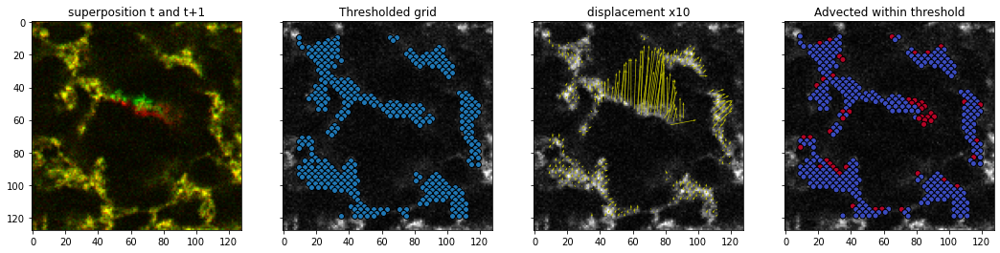

In [14]:
fig, axs = plt.subplots(1,4, figsize=(18,8), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
axs[0].set_title("superposition t and t+1")
axs[0].imshow(np.dstack((ims+[np.zeros_like(ims[0])])).astype(np.uint8))
axs[1].set_title("Thresholded grid")
axs[1].imshow(ims[0], 'gray')
axs[1].scatter(pts[:,1], pts[:,0],edgecolors='k')
axs[2].set_title("displacement x10")
axs[2].quiver(pts[:,1], pts[:,0], d[:,1], -d[:,0], units='xy', scale=0.1, color='y')
axs[2].imshow(ims[0], "gray")
axs[3].set_title("Advected within threshold")
axs[3].imshow(ims[1], 'gray')
axs[3].scatter(nextpts[:,1], nextpts[:,0],c=~stillin, cmap='coolwarm', edgecolors='k')
plt.savefig("discreet_process.png")

## Texture analysis

Test in prarallel 3 definitions of connectivity : Voronoi, Voronoi+bond must stay within threshold, Voronoi+distance cutoff, and distance cutoff alone. 

 - Voronoi onlone creates long distance links that have no physical meaning. This might cause an issue in the definition of plasticity in Graner&Dollet Texture analysis.
 - Adding the condiction that bonds must stay within threshold makes a bond network that look a lot like the gel network, but we observe a lot of bond disapearing in regions where points basically did not not move. Also slow.
 - Voronoi+cutoff defines a network pleasing to the eye, redable that corresponds better to physical links of the network.
 - Cutoff alone creates a high density of links, redundant to the eye. But this redundance should bring more stability to texture analysis. Also, some bonds disapearing in regions where points basically did not not move.

In [15]:
def voro_edges(pos):
    """Voronoi neighbors."""
    vor = Voronoi(pos) # create Voronoi diagram
    points_adj = vor.ridge_points
    edges = np.sort(points_adj, axis=-1)
    return np.array(sorted((a,b) for a,b in edges.astype(int)))

In [16]:
#texture evolution
pos = [pt[:, ::-1] for pt in goodpoints]
edges = [voro_edges(points) for points in pos]
short_edges = [
    bonds[np.sum(np.diff(points[bonds], axis=1)**2, (1,2))<(1.8*period)**2]
    for points, bonds in zip(pos, edges)
]
pairs = [np.array([[a,b] for a,b in KDTree(points).query_pairs(2*period)]) for points in pos]
lines = [bonds[np.array([
    np.all(profile_line(thresholded, points[a,::-1], points[b,::-1], mode='reflect'))
    for a,b in bonds
])] for points, bonds, thresholded in zip(pos, edges, thresholdeds)]
for bonds in [edges, lines, short_edges, pairs]:
    print(list(map(len, bonds)))

[840, 1018]
[635, 764]
[668, 820]
[2226, 2083]


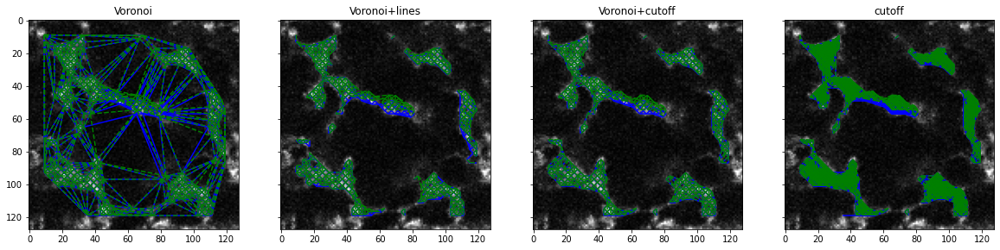

In [17]:
fig, axs = plt.subplots(1,4, figsize=(20,8), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)

for ax, bonds in zip(axs, [edges, lines, short_edges, pairs]):
    for points, color, ls, bond in zip(goodpoints, ['b', 'g'], ['-', '--'], bonds):
        lc = LineCollection(points[bond][..., [1,0]], colors=color, ls=ls)
        ax.add_collection(lc)
        #for (i, j) in bond:
        #    ax.plot([points[i, 1], points[j, 1]],
        #            [points[i, 0], points[j, 0]], "-"+color)


for ax, title in zip(axs, ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"]):
    ax.imshow(ims[0], "gray")
    ax.set_title(title)
plt.savefig("discreet_bonding_dynamics.png")

To get the redundance of pure cutoff bonds, but with Voronoi+cutoff, we use the second neighbours *after* cutoff.

In [18]:
import networkx as nx
def secondbonds(bonds):
    gr = nx.Graph()
    gr.add_edges_from(bonds)
    second = []
    for a, ngbs in gr.adj.items():
        for n in ngbs:
            for b in gr.adj[n]:
                if a<b:
                    second.append((a,b))
    return np.array([[a,b] for a,b in set(second)])

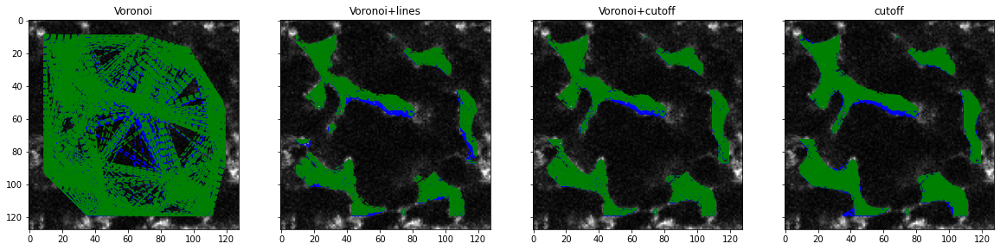

In [19]:
fig, axs = plt.subplots(1,4, figsize=(20,8), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)

for ax, bonds in zip(axs, [edges, lines, short_edges, pairs]):
    for points, color, bond in zip(goodpoints, ['b', 'g'], bonds):
        lc = LineCollection(points[np.vstack((bond, secondbonds(bond)))][..., [1,0]], colors=color, ls=ls)
        ax.add_collection(lc)
        #for (i, j) in np.vstack((bond, secondbonds(bond))):
        #    ax.plot([points[i, 1], points[j, 1]],
        #            [points[i, 0], points[j, 0]], "-"+color)


for ax, title in zip(axs, ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"]):
    ax.imshow(ims[0], "gray")
    ax.set_title(title)
plt.savefig("discreet_second_bonding_dynamics.png")

Voronoi+cutoff seems to have the least spurious plasticity 

In [20]:
from texture.grid import RegularGrid
from texture.texture import bin_texture, bin_changes, bonds_appeared_disapeared, C2B, statistical_relative_deformations, tri2square
from texture.display import display2Dcount, display_matrices, display_pos_edges

In [21]:
binning=8
grid = RegularGrid([binning,binning], [binning,binning], np.array(ims[0].shape)/binning-2)

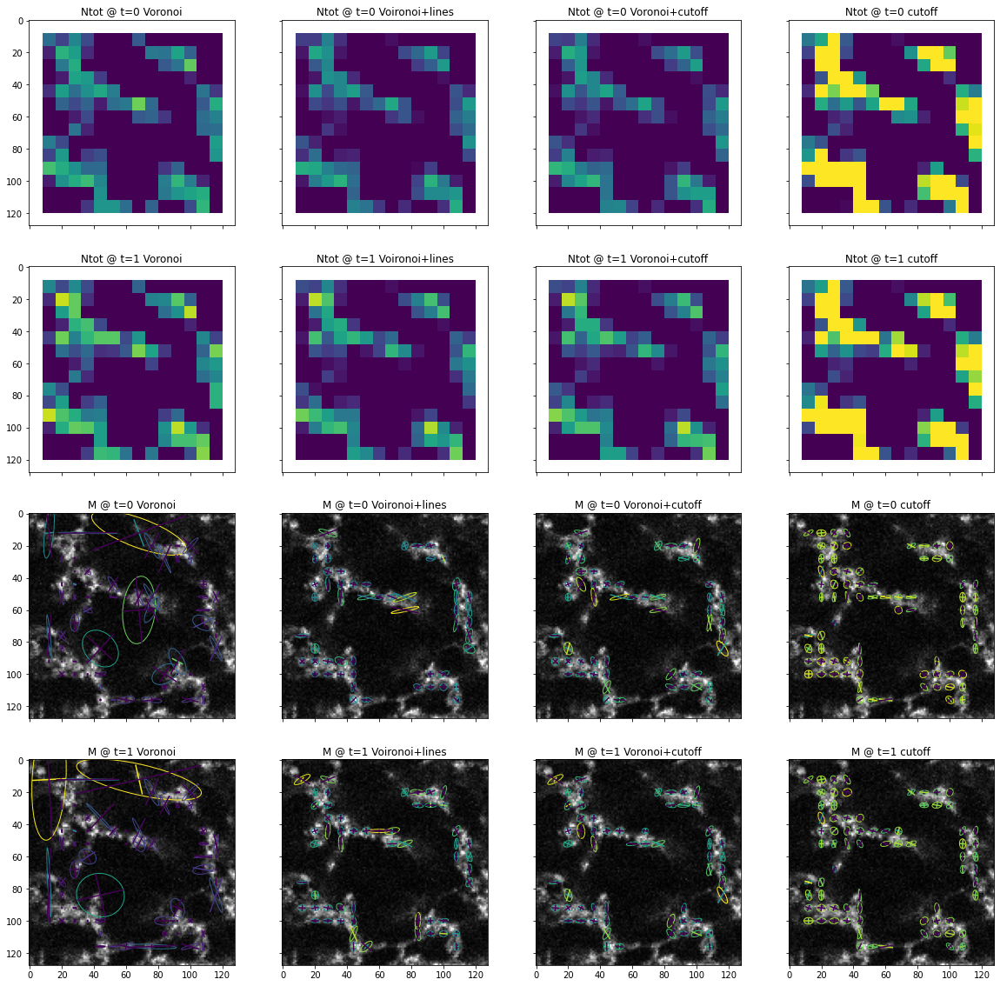

In [22]:
#static texture and static advected texture
fig, axs = plt.subplots(4,4, figsize=(20,20), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)

for icol, bonds in enumerate([edges, lines, short_edges, pairs]):
    for irow, points, bond, im in zip(range(2), goodpoints, bonds, ims):
        sumw, count = bin_texture(points[:,::-1], bond, grid, points_per_bond=2)
        M = sumw/np.maximum(1,count)[...,None]
        display2Dcount(axs[irow, icol], grid, count, vmin=0, vmax=50)
        display_matrices(axs[irow+2,icol], grid, M*(count>10)[...,None])
        axs[irow+2,icol].imshow(im, "gray")

for row, name in zip(axs,["Ntot @ t=0","Ntot @ t=1", "M @ t=0", "M @ t=1"]):
    for ax, title in zip(row, ["Voronoi", "Voironoi+lines", "Voronoi+cutoff", "cutoff"]):
        ax.set_title(f'{name} {title}')

In [23]:
%debug

ERROR:root:No traceback has been produced, nothing to debug.


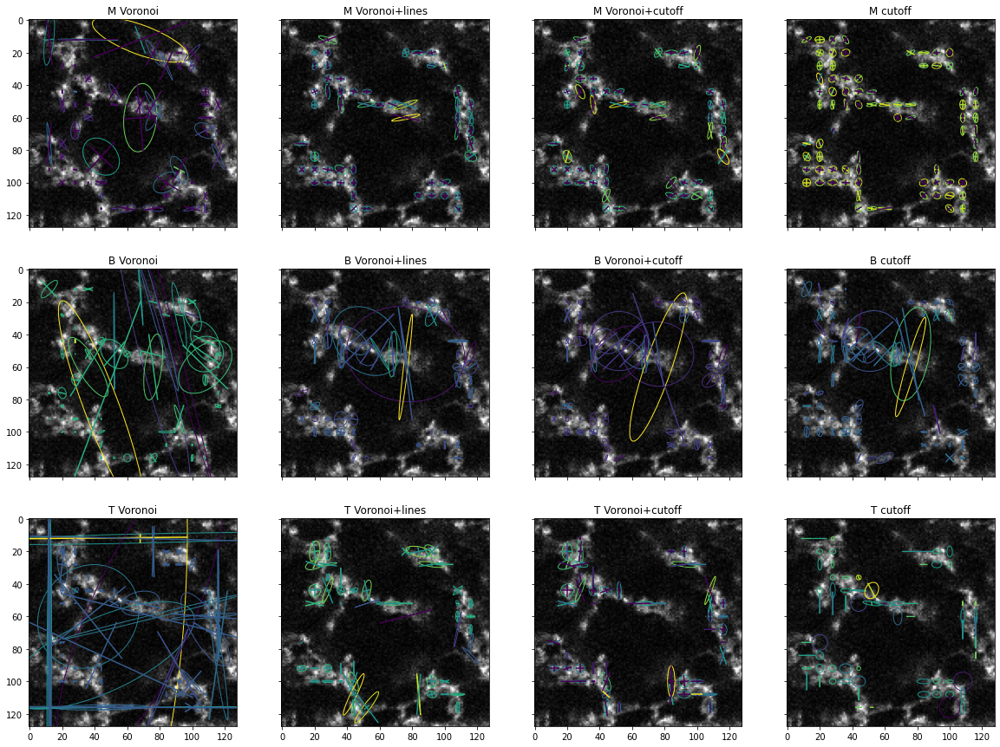

In [24]:
#Texture evolution (absolute)
fig, axs = plt.subplots(3,4, figsize=(20,15), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
for col, bonds, title in zip(axs.T, [edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"]):
    Mtot, Ntot = bin_texture(pos[0], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(pos[0], pos[1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    ## densities
    ### apprearing bonds, in 1/time (probably fps)
    na = 2 * Na_tot * Ntot_nz
    ### disapprearing bonds, in 1/time (probably fps)
    nd = 2 * Nd_tot * Ntot_nz
    ### conserved bonds, in 1/time (probably fps)
    nc = 2 * Nc_tot * Ntot_nz


    # display things!
    
    for ax, F, scale in zip(col[:3], [M,B,T], [1, 10,1]):
        ax.imshow(ims[0], "gray")
        display_matrices(ax, grid, F*(Ntot[...,None]>10))
        
    #ima = display2Dcount(col[3], grid, nd)
    #display2Dcount(col[4], grid, na)
    for ax, label in zip(col, ['M','B','T', 'n_d', 'n_a']):
        ax.set_title(f'{label} {title}')
    #fig.colorbar(display2Dcount(axs[1,2], grid, nc), ax=axs[1, 2], location='bottom')
    #fig.colorbar(ima, ax=axs[1, :2], shrink=0.6, location='bottom')
#plt.ylim(plt.ylim()[::-1])

statistical_relative_deformations on Voronoi. Omegamax=0.9628293807641636. Vmax=1.36. Pmax=1.62
statistical_relative_deformations on Voronoi+lines. Omegamax=0.544290540540541. Vmax=0.86. Pmax=1.33
statistical_relative_deformations on Voronoi+cutoff. Omegamax=0.5281690140845072. Vmax=1.24. Pmax=1.03
statistical_relative_deformations on cutoff. Omegamax=0.36259605662285177. Vmax=0.64. Pmax=0.38


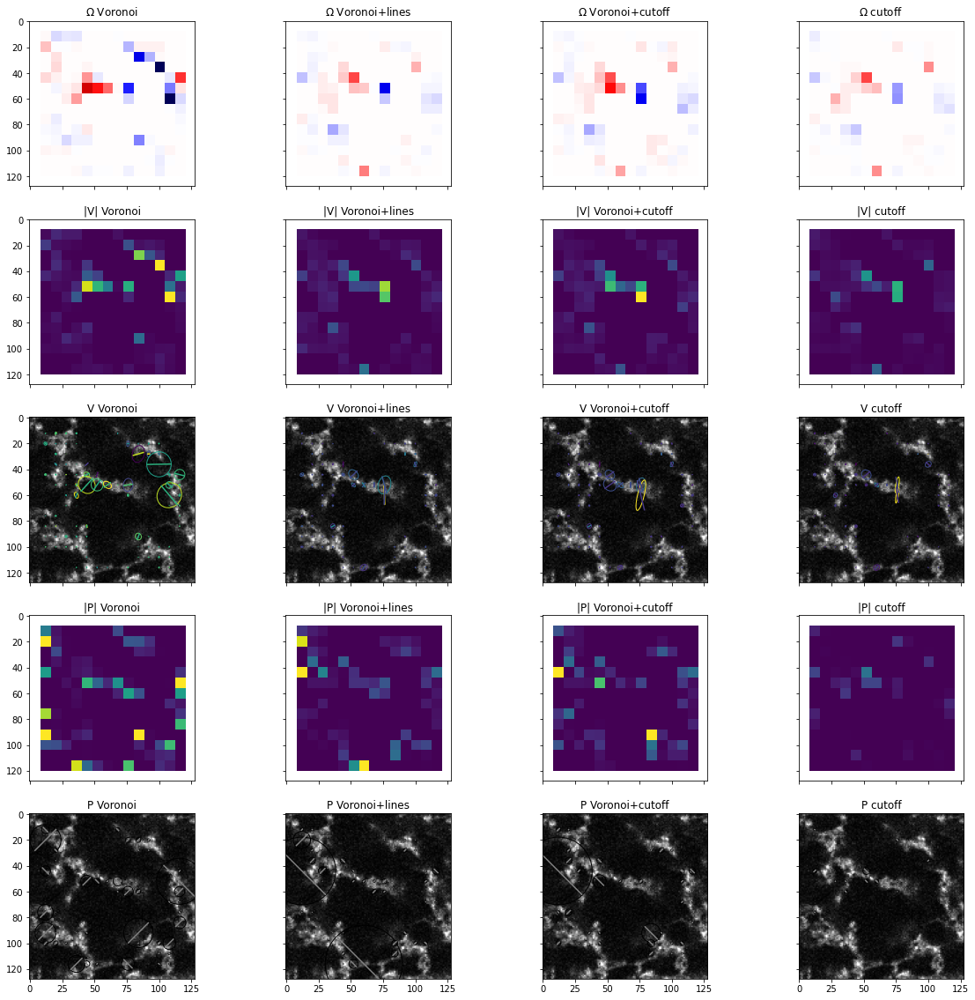

In [25]:
#Texture evolution (relative)
fig, axs = plt.subplots(5,4, figsize=(20,20), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)

for col, bonds, title in zip(axs.T, [edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"]):
    Mtot, Ntot = bin_texture(pos[0], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(pos[0], pos[1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    ## densities
    ### apprearing bonds, in 1/time (probably fps)
    na = 2 * Na_tot * Ntot_nz
    ### disapprearing bonds, in 1/time (probably fps)
    nd = 2 * Nd_tot * Ntot_nz
    ### conserved bonds, in 1/time (probably fps)
    nc = 2 * Nc_tot * Ntot_nz
    
    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)
    norm_V = np.linalg.norm(tri2square(V), axis=(-2,-1))
    norm_P = np.linalg.norm(tri2square(P), axis=(-2,-1))
    
    print(f'statistical_relative_deformations on {title}. Omegamax={np.abs(Omega).max()}. Vmax={norm_V.max():0.2f}. Pmax={norm_P[1:-1,1:-1].max():0.2f}')
    
    Nmin=1


    # display things!
    display2Dcount(col[0], grid, Omega*(Ntot>Nmin), cmap=plt.cm.seismic, vmin=-1, vmax=1)
    display2Dcount(col[1], grid, norm_V*(Ntot>Nmin), vmin=0, vmax=1)
    display2Dcount(col[3], grid, norm_P*(Ntot>Nmin), vmin=0, vmax=1)
    for ax, F in zip(col[2::2], [V,P]):
        ax.imshow(ims[0], "gray")
        display_matrices(ax, grid, F*(Ntot>Nmin)[...,None], scale=20)
    
    for ax, label in zip(col, [r'$\Omega$', '|V|', 'V', '|P|','P']):
        ax.set_title(f'{label} {title}')


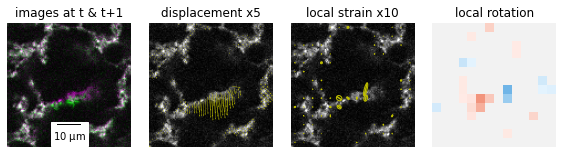

In [28]:
import seaborn
from matplotlib_scalebar.scalebar import ScaleBar

bonds = short_edges
Nmin=1

Mtot, Ntot = bin_texture(pos[0], bonds[0], grid, points_per_bond=2)
#bin changes between the two frames
Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(pos[0], pos[1], bonds[0], bonds[1], grid, points_per_bond=2)

#from sums to averages
Ntot_nz = 1/np.maximum(1, Ntot)

## matrices
### texture, in length**2
M = Mtot * Ntot_nz[...,None]
### geometrical changes, in length**2/time (probably px**2*fps)
C = 2 * Ctot * Ntot_nz[...,None, None]
B = C2B(C)
### topological changes, in length**2/time (probably px**2*fps)
T = 2 * Ttot * Ntot_nz[...,None]

## densities
### apprearing bonds, in 1/time (probably fps)
na = 2 * Na_tot * Ntot_nz
### disapprearing bonds, in 1/time (probably fps)
nd = 2 * Nd_tot * Ntot_nz
### conserved bonds, in 1/time (probably fps)
nc = 2 * Nc_tot * Ntot_nz

# link to continuous mechanics
V, Omega, P = statistical_relative_deformations(M, C, T)

fig, axs = plt.subplots(1,4, figsize=(8,2.25), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
axs[0].set_title("images at t & t+1")
axs[0].imshow(np.dstack((ims+[np.zeros_like(ims[0])])).astype(np.uint8)[...,[0,1,0]])
axs[1].set_title("displacement x5")
axs[1].quiver(pts[:,1], pts[:,0], d[:,1], d[:,0], units='xy', scale=0.2, color='y')
axs[1].imshow(ims[0], "gray")
axs[2].set_title("local strain x10")
axs[2].imshow(ims[0], "gray")
display_matrices(axs[2], grid, V*(Ntot>Nmin)[...,None], scale=10, col='y')
axs[3].set_title("local rotation")
display2Dcount(axs[3], grid, Omega*(Ntot>Nmin), cmap=seaborn.diverging_palette(250, 15, s=100, l=50, as_cmap=True, center="light"), vmin=-1, vmax=1)

for ax in axs:
    ax.set_axis_off()

scalebar = ScaleBar(px[0], "um", location='lower center')
axs[0].add_artist(scalebar)

plt.tight_layout()
plt.savefig("confocal_images_to_local_strain.pdf")

# Let's go 3D

# 3D

## On a smaller stack, with little or no global shear

In [29]:
stack = ser.getFrame(38)
profile = np.ma.array(stack, mask=stack>254).mean((1,2))

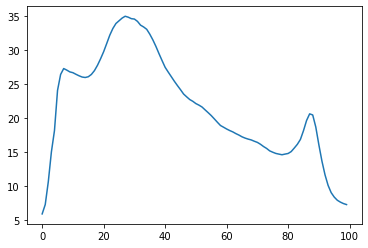

In [30]:
plt.plot(profile)

The profile is basically unchanged with time (tested)

In [31]:
def normalize_stack(stack, px, preblur=1., profile=None):
    if profile is None:
        profile = np.ma.array(stack, mask=stack>254).mean((1,2))
    f0 = gaussian_filter(stack.astype(float), preblur*px[0]/px[::-1])
    f0 /= profile[:,None,None]
    return (f0/f0.max()*255).astype(np.uint8)

In [32]:
#ims = [ser.getFrame(T=38+i).astype(np.float32)[:,200:328,0:128] for i in range(2)]
ims = [normalize_stack(ser.getFrame(T=38+i)[8:80,200:328,0:128], px, profile=profile[8:80]) for i in range(2)]

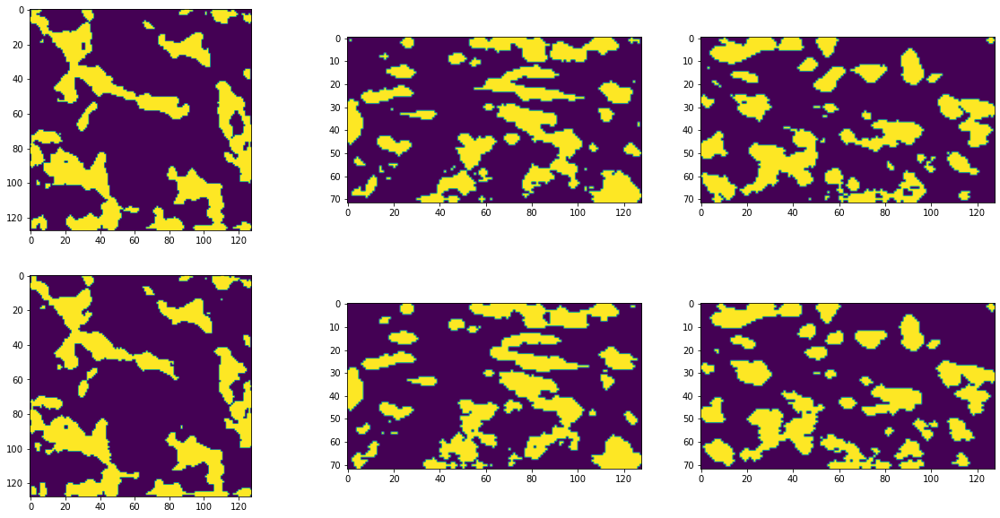

In [33]:
threshold = np.array([threshold_li(plane) for plane in ims[0]])
#thresholdeds = [grey_dilation(gaussian_filter(im, px[0]/px[::-1])>threshold[:,None,None], 3) for im in ims]
thresholdeds = [binary_opening(im>threshold[:,None,None]) for im in ims]
fig, axs = plt.subplots(2,3, figsize=(20,10), subplot_kw={'aspect': 'equal'})
for row, thresholded in zip(axs,thresholdeds):
    row[0].imshow(thresholded[22])
    row[1].imshow(thresholded[:,52])
    row[2].imshow(thresholded[:,:,64])

(2, 4, 4)


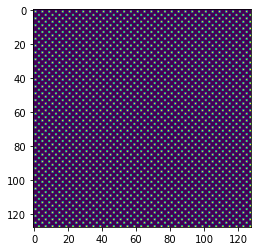

In [34]:
period = 4
gridcell = np.vstack((
    (np.arange(period)==period-1)[None,:,None] & (np.arange(period)==period-1)[None,None,:],
    (np.arange(period)==period//2-1)[None,:,None] & (np.arange(period)==period//2-1)[None,None,:]
))
print(gridcell.shape)
grid3D = np.tile(gridcell, np.array(ims[0].shape)//[2, period, period])
plt.imshow(np.any(grid3D,0))

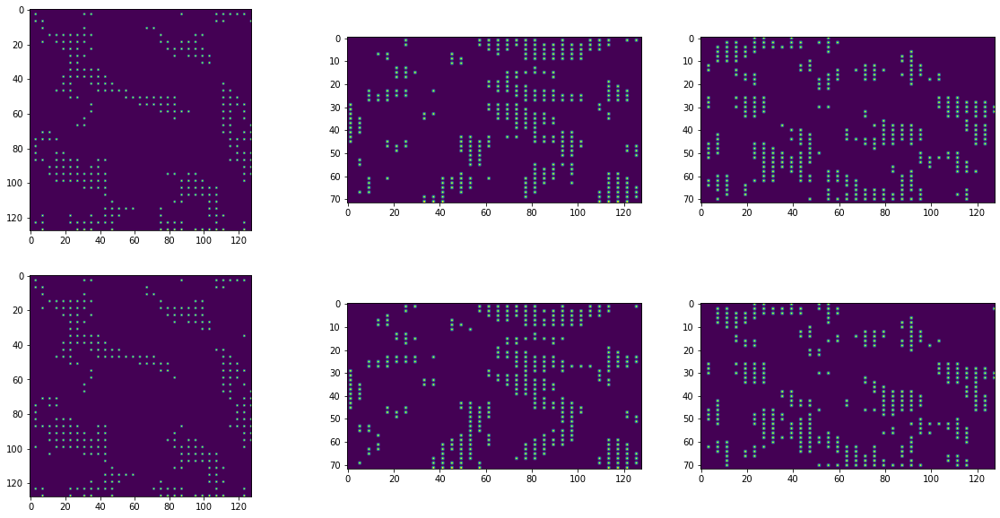

In [35]:
fig, axs = plt.subplots(2,3, figsize=(20,10), subplot_kw={'aspect': 'equal'})
for row, thresholded in zip(axs,thresholdeds):
    row[0].imshow((thresholded&grid3D)[22])
    row[1].imshow((thresholded&grid3D)[:,53])
    row[2].imshow((thresholded&grid3D)[:,:,63])

Text(0.5, 0, 'plane')

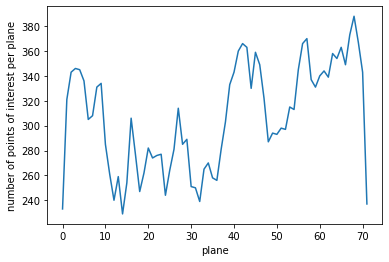

In [36]:
plt.plot((thresholded&grid3D).sum((1,2)))
plt.ylabel('number of points of interest per plane')
plt.xlabel('plane')

We will consider a window of `2radius+1` around each point of interest. `radius=7` is good for our images. 4 is too small (noisy result).

In [268]:
radius = 8
zradius = 4
print(f'radius is {radius*px[0]} µm')
print(f'zradius is {zradius*px[-1]} µm')
print(f'window is {(2*radius+1)*px[0]:0.2f} µm x {(2*radius+1)*px[0]:0.2f} µm x {(2*zradius+1)*px[-1]:0.2f} µm')
nomargin = np.copy(grid3D & thresholdeds[0])
nomargin[:zradius] = False
nomargin[-zradius:] = False
nomargin[:,:radius] = False
nomargin[:,-radius:] = False
nomargin[:,:,:radius] = False
nomargin[:,:,-radius:] = False
pts = np.column_stack(np.where(nomargin))
print(pts.shape)

radius is 3.572175834043616 µm
zradius is 3.95200000000002 µm
window is 7.59 µm x 7.59 µm x 8.89 µm)
(15148, 3)


In [69]:
((1+2*radius)*px[0]/px[-1]-1)/2, ((1+2*np.arange(1,7))*px[-1]/px[0]-1)/2

(3.341535246630894,
 array([ 2.81898556,  5.03164259,  7.24429963,  9.45695667, 11.66961371,
        13.88227075]))

In [70]:
#distance between neighbouring grid elements
radius_um = np.linalg.norm(px * [[period,0,0], [period, period, 0], [0,0,2], [period//2, period//2,1]], axis=-1).max()
print(radius_um)
radius_um = 2.6

2.525909755842952


Point by point phase correlation to get the displacement at each point of interest

In [71]:
d = np.zeros(pts.shape)
error = np.zeros(pts.shape[0])
for u,(i,j,k) in enumerate(pts):
    d[u], error[u], trash = phase_cross_correlation(
        ims[1][i-zradius:i+zradius+1, j-radius:j+radius+1, k-radius:k+radius+1], 
        ims[0][i-zradius:i+zradius+1, j-radius:j+radius+1, k-radius:k+radius+1], 
        upsample_factor=10)

Remove points that have moved outside of the thresholded regions in the next frame

0.8753630842355427

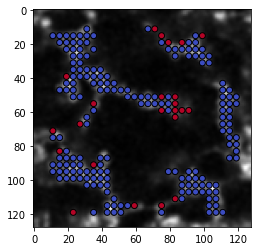

In [72]:
nextpts = pts+d
stillin = thresholdeds[1][tuple(nextpts.astype(int).T)]
plt.imshow(ims[0][22], 'gray')
inslice = np.abs(pts[:,0]-22)<1
plt.scatter(pts[inslice,2], pts[inslice,1],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')
goodpoints = [pts[stillin], nextpts[stillin]]
stillin.mean()

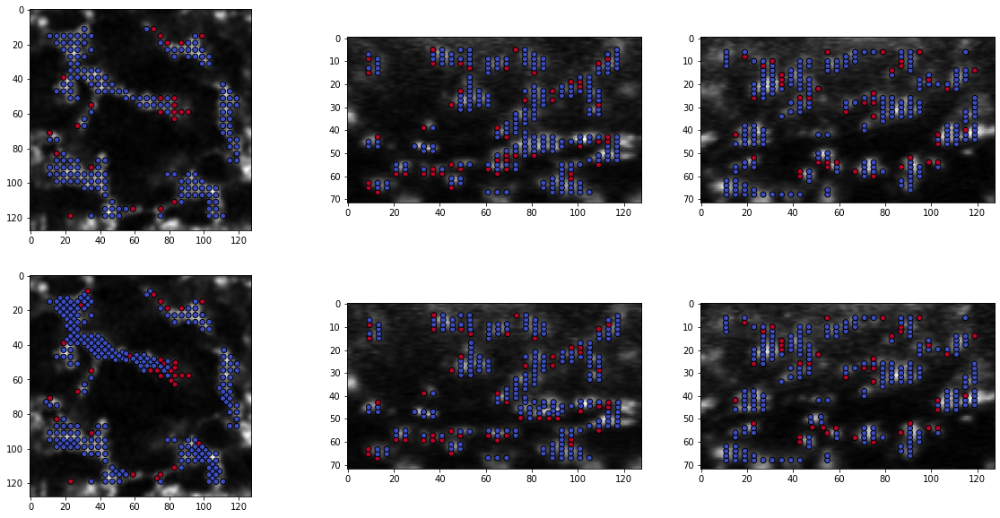

In [73]:
fig, axs = plt.subplots(2,3, figsize=(20,10), subplot_kw={'aspect': 'equal'})
for row, im, points in zip(axs,ims, [pts, pts+d]):
    row[0].imshow(im[22], 'gray')
    inslice = np.abs(points[:,0]-22)<1
    row[0].scatter(points[inslice,2], points[inslice,1],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')
    row[1].imshow(im[::-1,57], 'gray')
    inslice = np.abs(points[:,1]-57)<1
    row[1].scatter(points[inslice,2], im.shape[0]-points[inslice,0],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')
    row[2].imshow(im[::-1,:,63], 'gray')
    inslice = np.abs(points[:,2]-63)<1
    row[2].scatter(points[inslice,1], im.shape[0]-points[inslice,0],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')

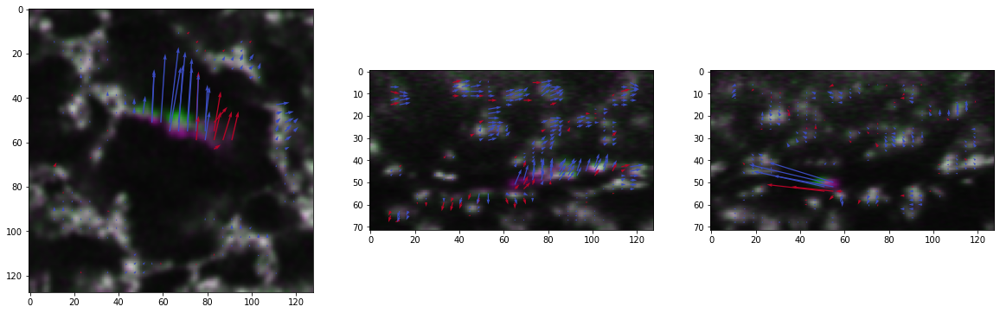

In [74]:
fig, axs = plt.subplots(1,3, figsize=(20,10), subplot_kw={'aspect': 'equal'})
axs[0].imshow(np.dstack([im[22] for im in ims])[...,[0,1,0]], 'gray')
inslice = np.abs(pts[:,0]-22)<1
axs[0].quiver(pts[inslice,2], pts[inslice,1], d[inslice,2], -d[inslice,1],~stillin[inslice], cmap='coolwarm', units='xy', scale=0.1)
axs[1].imshow(np.dstack([im[::-1,57] for im in ims])[...,[0,1,0]], 'gray')
inslice = np.abs(pts[:,1]-57)<1
axs[1].quiver(pts[inslice,2], ims[0].shape[0]-pts[inslice,0], d[inslice,2], d[inslice,0],~stillin[inslice], cmap='coolwarm', units='xy', scale=0.1)
axs[2].imshow(np.dstack([im[::-1,:,63] for im in ims])[...,[0,1,0]], 'gray')
inslice = np.abs(points[:,2]-63)<1
axs[2].quiver(pts[inslice,1], ims[0].shape[0]-pts[inslice,0], d[inslice,1], d[inslice,0],~stillin[inslice], cmap='coolwarm', units='xy', scale=0.1)

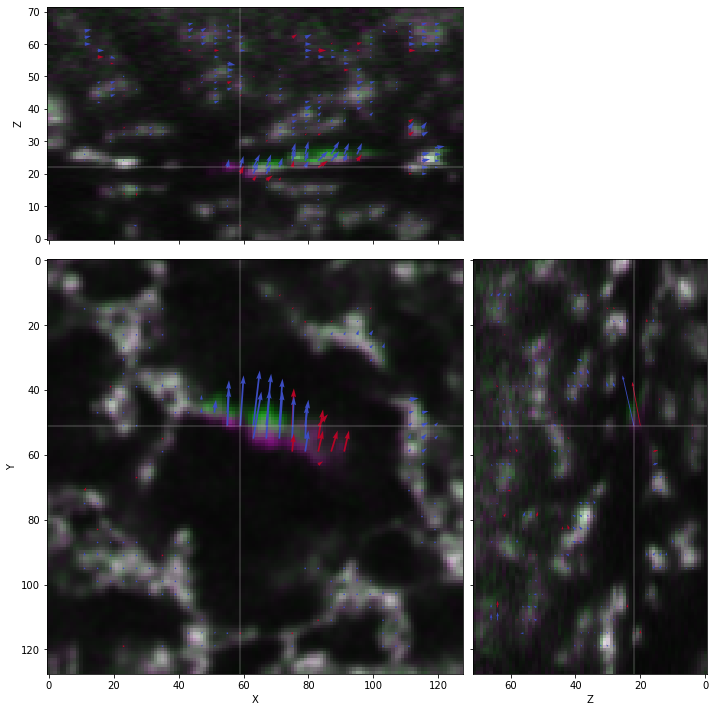

In [84]:
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={'width_ratios':[ims[0].shape[1],ims[0].shape[0]], 'height_ratios':[ims[0].shape[0],ims[0].shape[1]]}
)
Z = 22
Y = 51
X = 59
scale = 0.2
lc = (1,1,1,0.2)
axs[1,0].imshow(np.dstack([im[Z] for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(Y, color=lc)
axs[1,0].axvline(X, color=lc)
inslice = np.abs(pts[:,0]-Z)<1
axs[1,0].quiver(pts[inslice,2], pts[inslice,1], d[inslice,2], -d[inslice,1],~stillin[inslice], cmap='coolwarm', units='xy', scale=scale)
axs[1,0].set_xlabel('X')
axs[1,0].set_ylabel('Y')

axs[0,0].imshow(np.dstack([im[:,Y] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(X, color=lc)
inslice = np.abs(pts[:,1]-Y)<1
axs[0,0].quiver(pts[inslice,2], pts[inslice,0], d[inslice,2], d[inslice,0],~stillin[inslice], cmap='coolwarm', units='xy', scale=scale)
axs[0,0].set_ylim(axs[0,0].get_ylim()[::-1])
axs[0,0].set_ylabel('Z')

axs[1,1].imshow(np.dstack([im[:,:,X].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(Y, color=lc)
axs[1,1].axvline(Z, color=lc)
inslice = np.abs(pts[:,2]-X)<1
axs[1,1].quiver(pts[inslice,0], pts[inslice,1], -d[inslice,0], -d[inslice,1],~stillin[inslice], cmap='coolwarm', units='xy', scale=scale)
axs[1,1].set_xlim(axs[1,1].get_xlim()[::-1])
axs[1,1].set_xlabel('Z')

axs[0,1].set_visible(False)
plt.tight_layout()

In [85]:
d.max(0), np.linalg.norm(d, axis=-1).max()

(array([0.9, 0.2, 0.8]), 3.515679166249389)

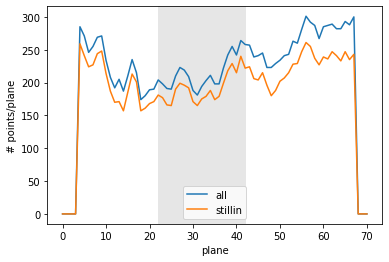

In [86]:
fig, ax = plt.subplots(1,1)
for points, label in zip([pts, goodpoints[0]], ['all', 'stillin']):
    ax.plot(
        np.histogram(points[:,0], np.arange(ims[0].shape[0]))[0], 
        label=label
    )
plt.xlabel('plane')
plt.ylabel('# points/plane')
#plt.ylim(-0.2,0.4)
plt.axvspan(30-2*zradius, 30+3*zradius, color=np.full(3, 0.9))
plt.legend()

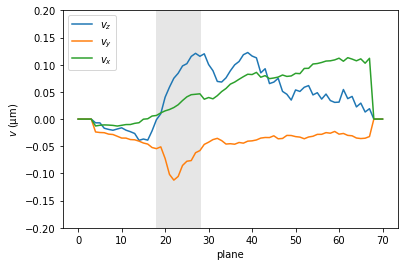

In [87]:
#fig, axs = plt.subplots(3,1, figsize=(8,10), sharex=True, sharey=True)
fig, ax = plt.subplots(1,1)
#for ax, v, label in zip(axs, (d*px[::-1]).T, 'zyx'):
for v, label in zip((d[stillin]*px[::-1]).T, 'zyx'):
    ax.plot(
        np.histogram(goodpoints[0][:,0], np.arange(ims[0].shape[0]), weights=v)[0] / np.maximum(1, np.histogram(pts[:,0], np.arange(ims[0].shape[0]))[0]), 
        label=f'$v_{label}$'
    )
    #ax.set_ylabel(f'$v_{label}$ (µm)')
    #ax.axvline(30)
plt.xlabel('plane')
plt.ylabel('$v$ (µm)')
plt.ylim(-0.2,0.2)
plt.axvspan(22-2*2, 22+3*2, color=np.full(3, 0.9))
plt.legend()

We are able to see the affine trend on $v_x$, and the signature of the breaking event around z=30

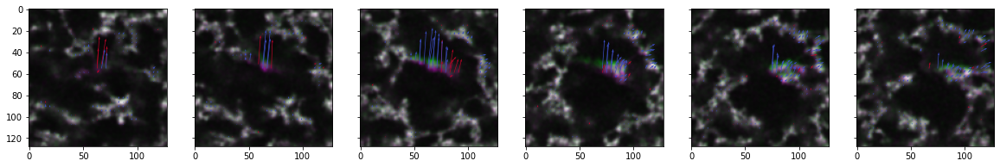

In [88]:
fig, axs = plt.subplots(1,6, figsize=(20,6), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
for z,ax in zip(range(22-2*2, 22+4*2, 2), axs):
    inslice = np.abs(pts[:,0]-z)<1
    ax.quiver(pts[inslice,-1], pts[inslice,-2], d[inslice,-1], -d[inslice,-2],~stillin[inslice], cmap='coolwarm', units='xy', scale=0.1)
    ax.imshow(np.dstack([im[z] for im in ims])[...,[0,1,0]], "gray")

In [89]:
edges = [voro_edges(points) for points in goodpoints]
#scale the coordinates according to physical pixel dimensions before computing distances
short_edges = [
    bonds[np.sum(np.diff((points*px[::-1])[bonds], axis=1)**2, (1,2))<(radius_um)**2]
    for points, bonds in zip(goodpoints, edges)
]
pairs = [np.array([[a,b] for a,b in KDTree(points*px[::-1]).query_pairs(radius_um)]) for points in goodpoints]
#profile_line from scikit-image does not work in 3D, so we onl test the middle.
lines = [
    bonds[thresholded[tuple(points[bonds].mean(1).astype(int).T)]]
    for points, bonds in zip(goodpoints, edges)
]
for bonds in [edges, lines, short_edges, pairs]:
    print(list(map(len, bonds)))

[88850, 94734]
[67043, 70645]
[59057, 60185]
[70600, 74049]


Short Voronoi edges

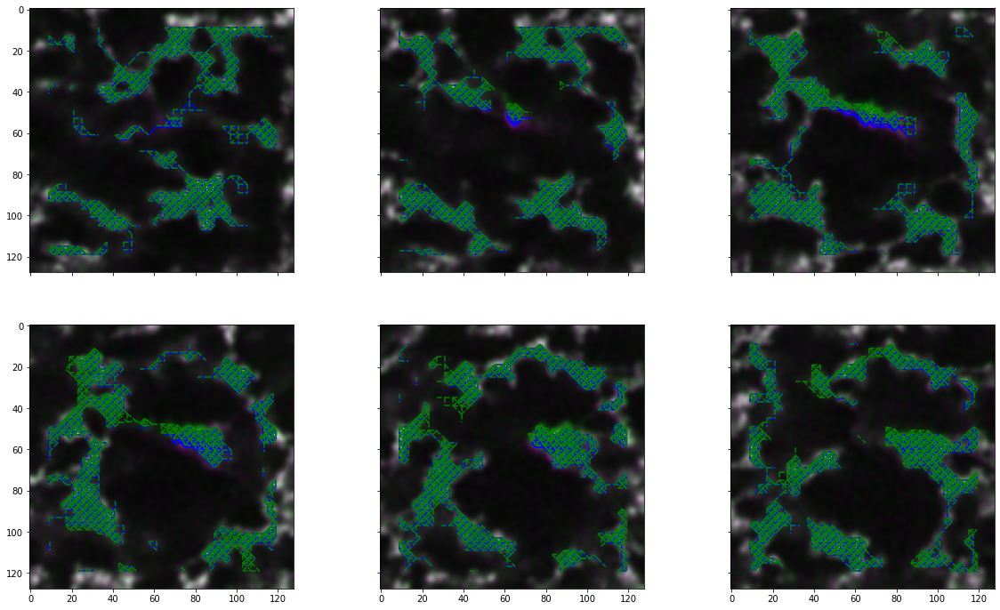

In [90]:
fig, axs = plt.subplots(2,3, figsize=(20,12), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
Z = 22
for points, bonds, color, ls in zip(goodpoints, short_edges, ['b', 'g'], ['-', '--']):
    for z,ax in zip(range(Z-2*2, Z+4*2, 2), axs.ravel()):
        inslice = np.abs(points[:,0]-z)<2
        lc = LineCollection(points[bonds[np.all(inslice[bonds], axis=-1)]][..., [2,1]], colors=color, ls=ls)
        ax.add_collection(lc)

for z,ax in zip(range(Z-2*2, Z+4*2, 2), axs.ravel()):
    ax.imshow(np.dstack([im[z] for im in ims])[...,[0,1,0]], "gray")

#plt.savefig("discreet_bonding_dynamics3D.png")

Neighbours within range

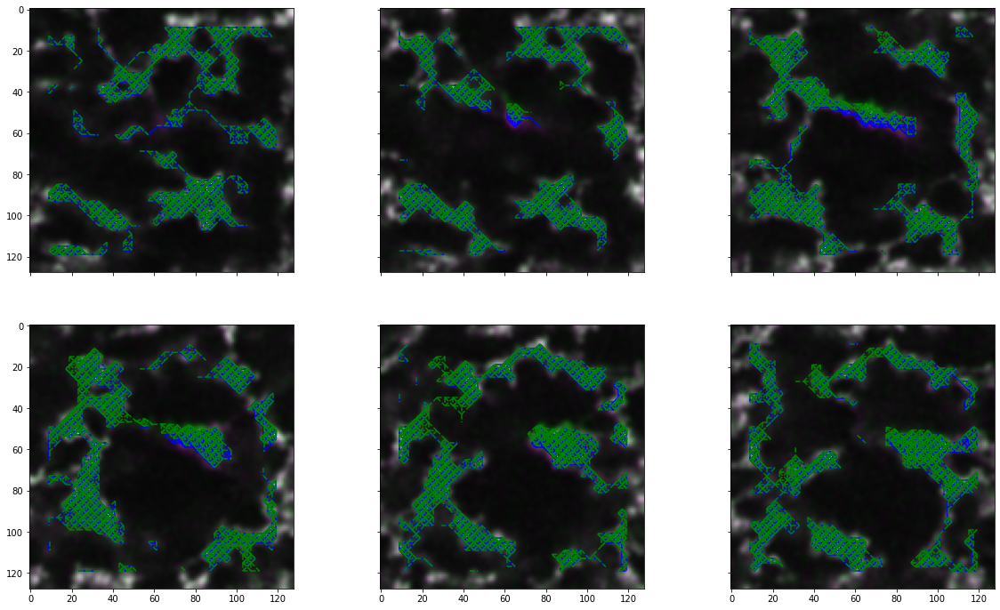

In [91]:
fig, axs = plt.subplots(2,3, figsize=(20,12), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
Z = 22
for points, bonds, color, ls in zip(goodpoints, pairs, ['b', 'g'], ['-', '--']):
    for z,ax in zip(range(Z-2*2, Z+4*2, 2), axs.ravel()):
        inslice = np.abs(points[:,0]-z)<2
        lc = LineCollection(points[bonds[np.all(inslice[bonds], axis=-1)]][..., [2,1]], colors=color, ls=ls)
        ax.add_collection(lc)

for z,ax in zip(range(Z-2*2, Z+4*2, 2), axs.ravel()):
    ax.imshow(np.dstack([im[z] for im in ims])[...,[0,1,0]], "gray")

#plt.savefig("discreet_bonding_dynamics3D.png")

Voronoi edge which middle point lies within the thresholded region

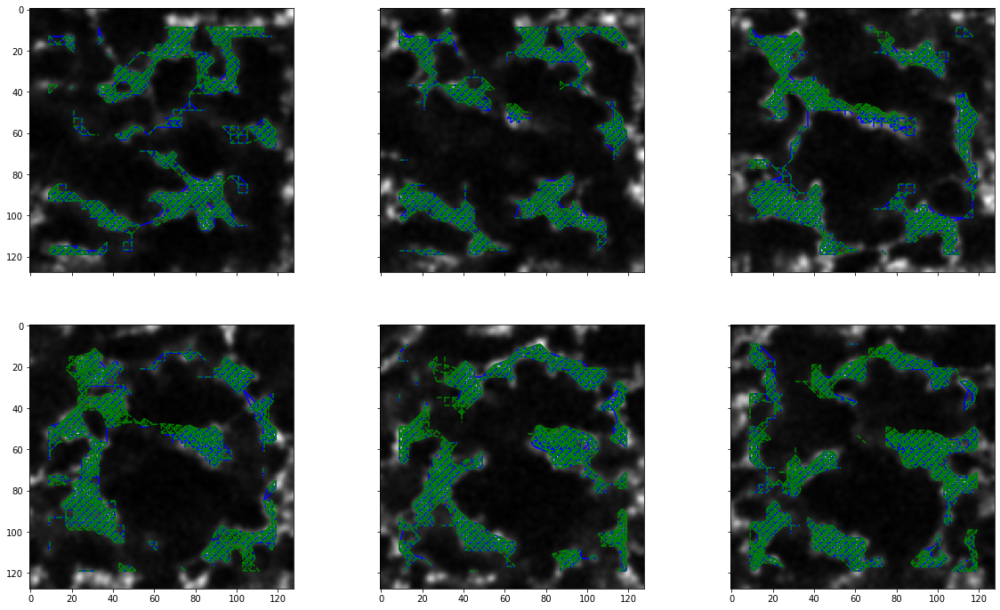

In [92]:
fig, axs = plt.subplots(2,3, figsize=(20,12), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)
Z = 22
for points, bonds, color, ls in zip(goodpoints, lines, ['b', 'g'], ['-', '--']):
    for z,ax in zip(range(Z-2*2, Z+4*2, 2), axs.ravel()):
        inslice = np.abs(points[:,0]-z)<2
        lc = LineCollection(points[bonds[np.all(inslice[bonds], axis=-1)]][..., [2,1]], colors=color, ls=ls)
        ax.add_collection(lc)

for z,ax in zip(range(Z-2*2, Z+4*2, 2), axs.ravel()):
    ax.imshow(ims[0][z], "gray")

#plt.savefig("discreet_bonding_dynamics3D.png")

Good network continuity in all cases. Lines might be a bit more noisy on the edges of the clusters.

### Texture analysis in 3D

In [100]:
import texture.display 
reload(texture.display)
from texture.display import display2Dcount, display_matrices, display_pos_edges

#### Checking display

Is it XYZ or ZYX ?

In [101]:
testgrid = RegularGrid([0,0,0], [1,1,1], [3,4,5])
testgrid2D = RegularGrid([0,0], [1,1], [4,5])

In [102]:
zyx = np.array([[1.75, 0.5, 0.5],[0.5, 2.75, 0.5], [0.5, 0.5, 3.75]])
bnds = np.array([[0,1], [0,2], [1,2]])
sumw, count = bin_texture(zyx, bnds,testgrid)
M = sumw / np.maximum(1,count)[...,None]

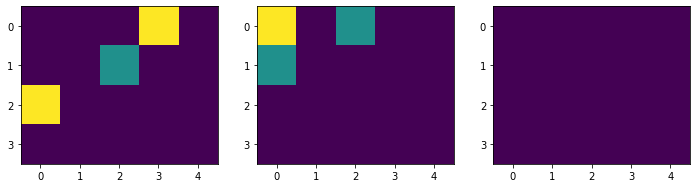

In [103]:
fig, axs = plt.subplots(1,3, figsize=(12,6), subplot_kw={'aspect': 'equal'})
for ax, c, z in zip(axs, count, range(3)):
    ax.imshow(c, vmin=0, vmax=count.max())

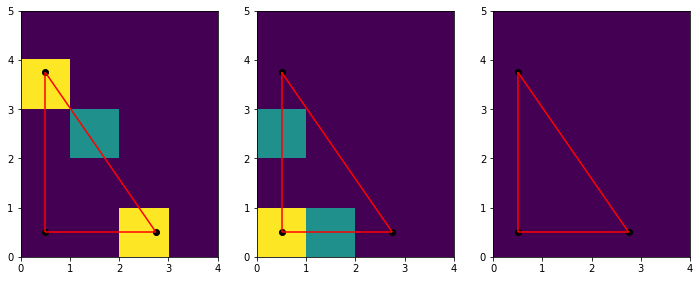

In [104]:
fig, axs = plt.subplots(1,3, figsize=(12,6), subplot_kw={'aspect': 'equal'})
for ax, c in zip(axs, count):
    display2Dcount(ax, testgrid2D, c, vmin=0, vmax=count.max())
    display_pos_edges(ax, zyx[:,1:], bnds)

In [105]:
#Checks that the y and x components of the matrix can be obtained by removing the three first coefficients of M
i,j = np.triu_indices(2)
np.all(tri2square(M)[...,1:,1:][...,i,j] == M[...,3:])

True

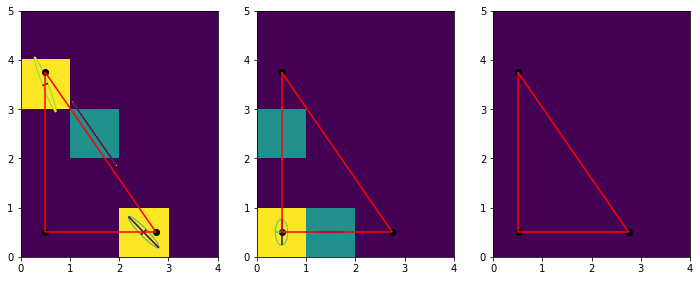

In [106]:
fig, axs = plt.subplots(1,3, figsize=(12,6), subplot_kw={'aspect': 'equal'})
for ax, c, m in zip(axs, count, M[...,3:]):
    display_matrices(ax, testgrid2D, m, scale=0.1)
    display_pos_edges(ax, zyx[:,1:], bnds)
    display2Dcount(ax, testgrid2D, c, vmin=0, vmax=count.max())

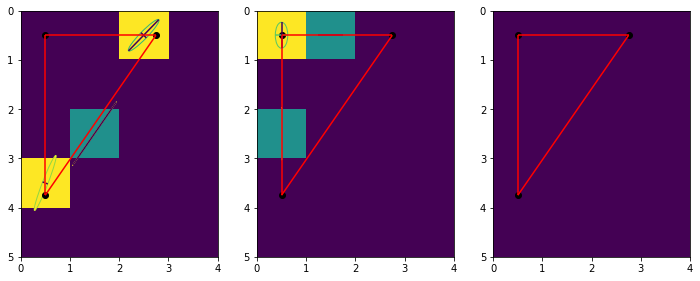

In [107]:
fig, axs = plt.subplots(1,3, figsize=(12,6), subplot_kw={'aspect': 'equal'})
for ax, c, m in zip(axs, count, M[...,3:]):
    display_matrices(ax, testgrid2D, m, scale=0.1)
    display_pos_edges(ax, zyx[:,1:], bnds)
    display2Dcount(ax, testgrid2D, c, vmin=0, vmax=count.max())
    ax.invert_yaxis()

No need to switch anything.

#### Actual analysis

Let's display as built in the `dirdip` package. It means that YX images need to be transposed

In [297]:
[zradius,radius,radius]*px[::-1]

array([3.952     , 3.57217583, 3.57217583])

In [145]:
grid = RegularGrid([zradius,radius,radius]*px[::-1], [zradius, radius,radius]*px[::-1], np.array(ims[0].shape)//[zradius, radius, radius]-2)
gridYX = RegularGrid([radius,radius], [radius,radius], np.array(ims[0].shape[1:])//radius-2)
gridZX = RegularGrid([zradius,radius], [zradius,radius], np.array(ims[0].shape)[[0,2]]//[zradius,radius]-2)
gridYZ = RegularGrid([radius, zradius], [radius, zradius], np.array(ims[0].shape)[[1,0]]//[radius,zradius]-2)

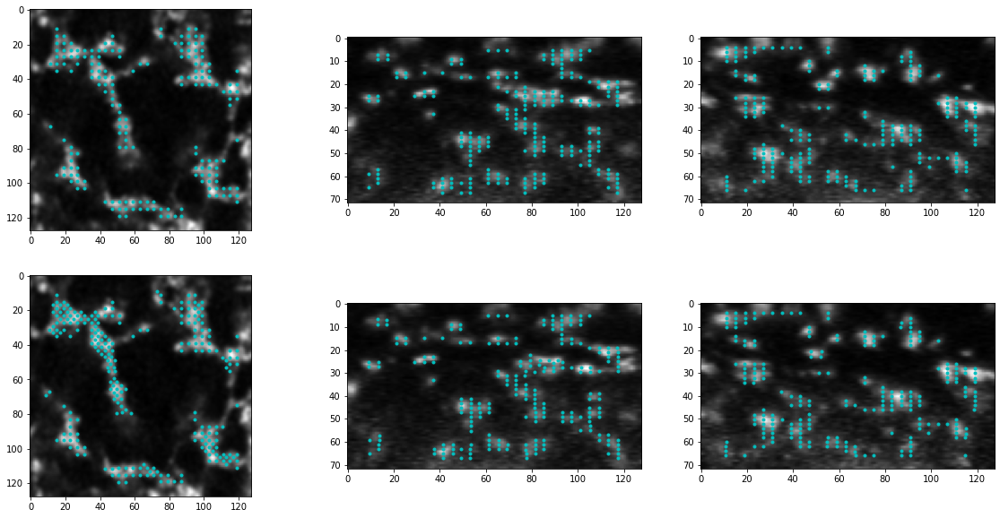

In [94]:
fig, axs = plt.subplots(2,3, figsize=(20,10), subplot_kw={'aspect': 'equal'})
for row, im, points in zip(axs,ims, goodpoints):
    inslice = np.abs(points[:,0]-22)<1
    display_pos_edges(row[0], points[inslice,1:], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
    row[0].imshow(im[22].T, 'gray')
    #row[0].scatter(points[inslice,2], points[inslice,1],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')
    
    inslice = np.abs(points[:,1]-57)<1
    display_pos_edges(row[1], points[inslice][...,[2,0]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
    #row[1].scatter(points[inslice,2], im.shape[0]-points[inslice,0],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')
    row[1].imshow(im[:,57], 'gray')
    
    inslice = np.abs(points[:,2]-63)<1
    display_pos_edges(row[2], points[inslice][...,[1,0]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
    #row[2].scatter(points[inslice,1], im.shape[0]-points[inslice,0],c=~stillin[inslice], cmap='coolwarm', edgecolors='k')
    row[2].imshow(im[:,:,63], 'gray')

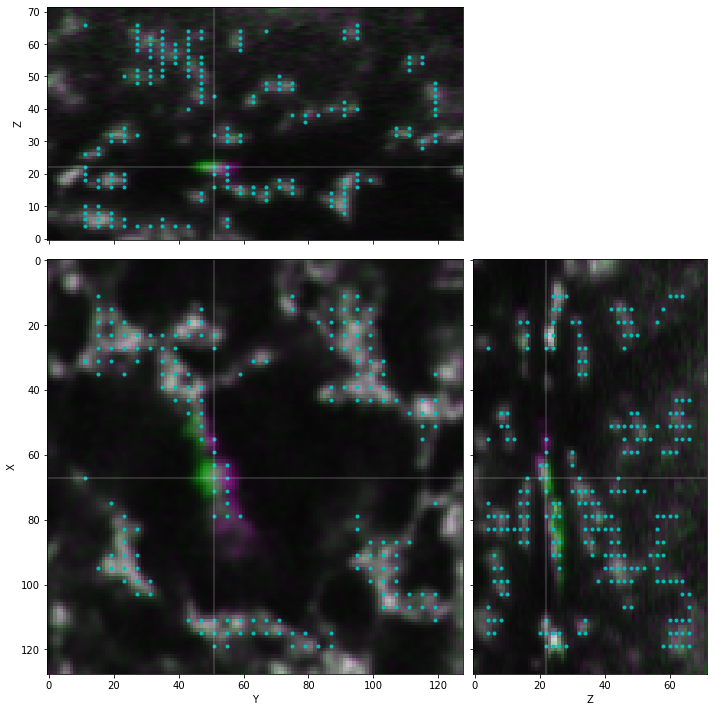

In [269]:
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={'width_ratios':[ims[0].shape[1],ims[0].shape[0]], 'height_ratios':[ims[0].shape[0],ims[0].shape[1]]}
)
points = goodpoints[0]
Z = 22
Y = 51
X = 67
lc = (1,1,1,0.2)
axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
inslice = np.abs(points[:,0]-Z)<1
display_pos_edges(axs[1,0], points[inslice,1:], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')

axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
inslice = np.abs(points[:,2]-X)<1
display_pos_edges(axs[0,0], points[inslice][...,[1,0]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[0,0].invert_yaxis()#set_ylim(axs[0,0].get_ylim()[::-1])
axs[0,0].set_ylabel('Z')

axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
inslice = np.abs(points[:,1]-Y)<1
display_pos_edges(axs[1,1], points[inslice][...,[0,2]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
#axs[1,1].quiver(pts[inslice,0], pts[inslice,1], -d[inslice,0], -d[inslice,1],~stillin[inslice], cmap='cool_r', units='xy', scale=scale)
#axs[1,1].set_xlim(axs[1,1].get_xlim()[::-1])
axs[1,1].set_xlabel('Z')

axs[0,1].set_visible(False)
plt.tight_layout()
plt.savefig('discreet_3D_points.png')

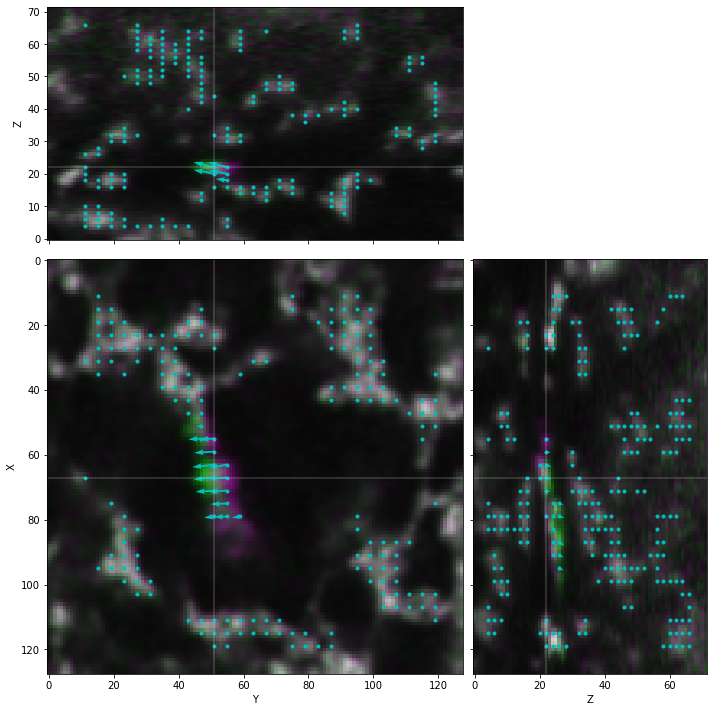

In [296]:
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={'width_ratios':[ims[0].shape[1],ims[0].shape[0]], 'height_ratios':[ims[0].shape[0],ims[0].shape[1]]}
)
points = goodpoints[0]
displ = goodpoints[1] - goodpoints[0]
Z = 22
Y = 51
X = 67
lc = (1,1,1,0.2)
axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
inslice = np.abs(points[:,0]-Z)<1
display_pos_edges(axs[1,0], points[inslice,1:], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[1,0].quiver(points[inslice,-2], points[inslice,-1], displ[inslice,-2], -displ[inslice,-1], color='c', units='xy', scale=0.5)
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')

axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
inslice = np.abs(points[:,2]-X)<1
display_pos_edges(axs[0,0], points[inslice][...,[1,0]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[0,0].quiver(points[inslice,1], points[inslice,0], displ[inslice,1], displ[inslice,0], color='c', units='xy', scale=0.5)
axs[0,0].invert_yaxis()#set_ylim(axs[0,0].get_ylim()[::-1])
axs[0,0].set_ylabel('Z')

axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
inslice = np.abs(points[:,1]-Y)<1
display_pos_edges(axs[1,1], points[inslice][...,[0,2]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[1,1].quiver(points[inslice,0], points[inslice,2], displ[inslice,0], -displ[inslice,2], color='c', units='xy', scale=0.5)
#axs[1,1].quiver(pts[inslice,0], pts[inslice,1], -d[inslice,0], -d[inslice,1],~stillin[inslice], cmap='cool_r', units='xy', scale=scale)
#axs[1,1].set_xlim(axs[1,1].get_xlim()[::-1])
axs[1,1].set_xlabel('Z')

axs[0,1].set_visible(False)
plt.tight_layout()
plt.savefig('discreet_3D_displ.png')

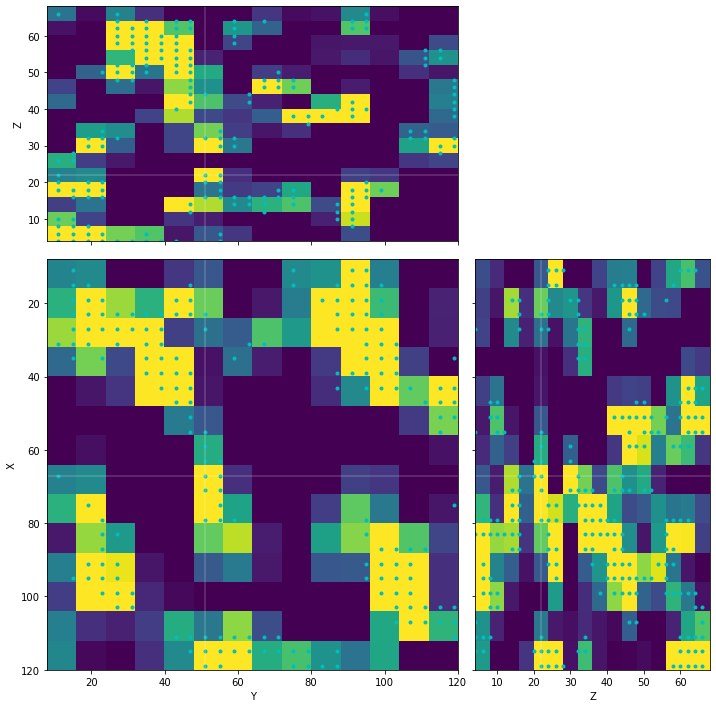

In [257]:
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius], 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints[0]
bonds = pairs[0]
Z = 22
Y = 51
X = 67
vmax=100
lc = (1,1,1,0.2)
sumw, count = bin_texture(points*px[::-1], bonds, grid, points_per_bond=2)
M = sumw/np.maximum(1,count)[...,None]
#axs[1,0].imshow(np.dstack([im[Z].T for im in ims+[np.zeros_like(ims[0])]]), 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
display2Dcount(axs[1,0], gridYX, count[Z//zradius-1], vmin=0, vmax=vmax)
inslice = np.abs(points[:,0]-Z)<1
display_pos_edges(axs[1,0], points[inslice,1:], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')

#axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims+[np.zeros_like(ims[0])]]), 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
display2Dcount(axs[0,0], gridYZ, count[:,:,X//radius-1].T, vmin=0, vmax=vmax)
inslice = np.abs(points[:,2]-X)<1
display_pos_edges(axs[0,0], points[inslice][...,[1,0]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
#axs[0,0].set_ylim(axs[0,0].get_ylim()[::-1])
axs[0,0].set_ylabel('Z')

#axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims+[np.zeros_like(ims[0])]]), 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
display2Dcount(axs[1,1], gridZX, count[:,Y//radius-1], vmin=0, vmax=vmax)
inslice = np.abs(points[:,1]-Y)<1
display_pos_edges(axs[1,1], points[inslice][...,[0,2]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
axs[1,1].set_xlabel('Z')

axs[1,0].invert_yaxis()
axs[0,1].set_visible(False)
plt.tight_layout()

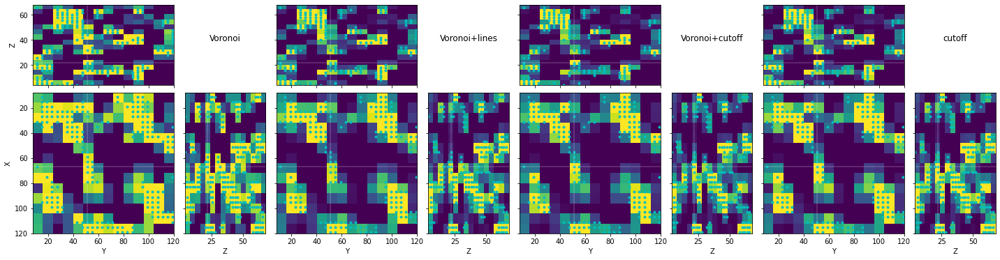

In [255]:
#static texture, for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints[0]
Z = 22
Y = 51
X = 67
vmax=100
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges[0], lines[0], short_edges[0], pairs[0]], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    sumw, count = bin_texture(points*px[::-1], bonds, grid, points_per_bond=2)
    M = sumw/np.maximum(1,count)[...,None]
    #axs[1,0].imshow(np.dstack([im[Z].T for im in ims+[np.zeros_like(ims[0])]]), 'gray')
    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    display2Dcount(axs[1,0], gridYX, count[Z//zradius-1], vmin=0, vmax=vmax)
    inslice = np.abs(points[:,0]-Z)<1
    display_pos_edges(axs[1,0], points[inslice,1:], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
    axs[1,0].set_xlabel('Y')

    #axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims+[np.zeros_like(ims[0])]]), 'gray')
    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)
    display2Dcount(axs[0,0], gridYZ, count[:,:,X//radius-1].T, vmin=0, vmax=vmax)
    inslice = np.abs(points[:,2]-X)<1
    display_pos_edges(axs[0,0], points[inslice][...,[1,0]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
    #axs[0,0].set_ylim(axs[0,0].get_ylim()[::-1])

    #axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims+[np.zeros_like(ims[0])]]), 'gray')
    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    display2Dcount(axs[1,1], gridZX, count[:,Y//radius-1], vmin=0, vmax=vmax)
    inslice = np.abs(points[:,1]-Y)<1
    display_pos_edges(axs[1,1], points[inslice][...,[0,2]], np.zeros((0,2), dtype=int),kw_pos = {'marker': '.', 'c': 'c'})
    axs[1,1].set_xlabel('Z')
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[1,0].invert_yaxis()
plt.tight_layout()

To display static texture in 2D, we need to properly prune the upper triangular coefficients of the 3D matrix.
$$\begin{align}\left(\begin{array}{ccc} 
0 & 1 & 2\\
1 & 3 & 4\\
2 & 4 & 5
\end{array}\right) 
&\xrightarrow{\perp Z} \left(\begin{array}{cc} 
3 & 4\\
4 & 5
\end{array}\right)\\
&\xrightarrow{\perp Y} \left(\begin{array}{cc} 
0 & 2\\
2 & 5
\end{array}\right)\\
&\xrightarrow{\perp X} \left(\begin{array}{cc} 
0 & 1\\
1 & 3\\
\end{array}\right)\\
\end{align}$$

In addition, the ZX plane is displayed transposed, therefore the matrix must be transposed as $$\left(\begin{array}{cc} 
5 & 2\\
2 & 0
\end{array}\right)$$

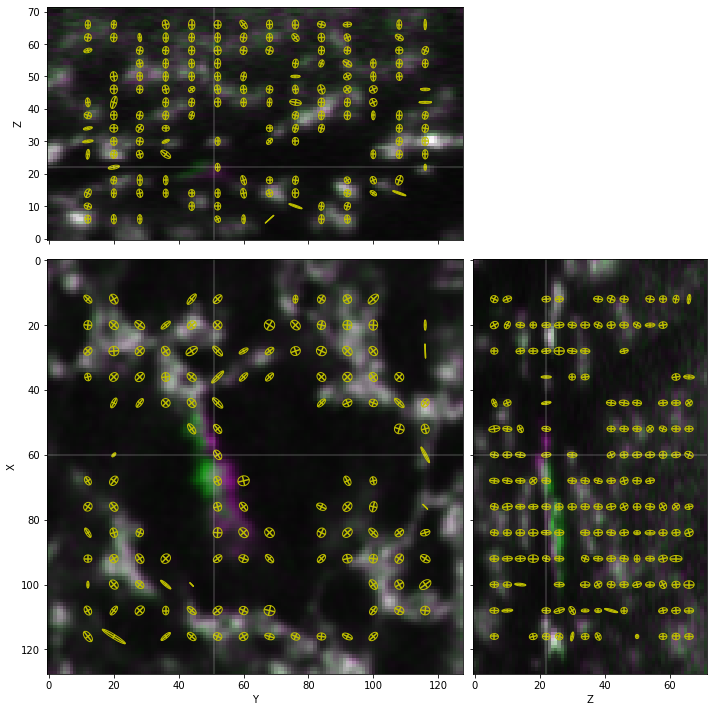

In [199]:
#static texture
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1],ims[0].shape[0]], 
        'height_ratios':[ims[0].shape[0],ims[0].shape[1]]
    }
)
points = goodpoints[0]
bonds = pairs[0]
Z = 22
Y = 51
X = 60
scale=2
vmax=100

sumw, count = bin_texture(points*px[::-1], bonds, grid, points_per_bond=2)
M = sumw/np.maximum(1,count)[...,None]

axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
display_matrices(axs[1,0], gridYX, M[Z//zradius-1, ...,3:], scale=scale, col='y')


axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
display_matrices(axs[0,0], gridYZ, M[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
axs[0,0].invert_yaxis()

axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
display_matrices(axs[1,1], gridZX, M[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')

axs[0,1].set_visible(False)
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')
axs[0,0].set_ylabel('Z')
axs[1,1].set_xlabel('Z')

plt.tight_layout()

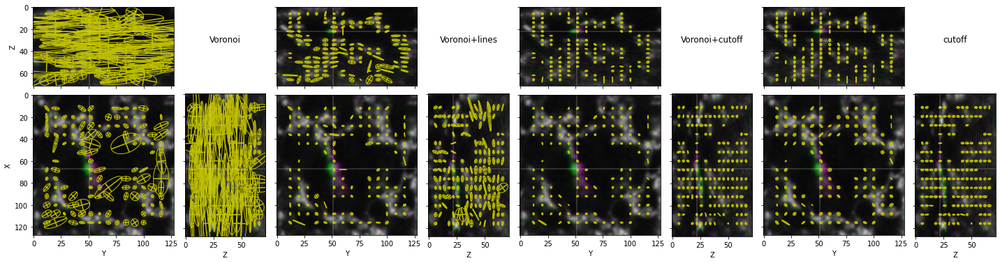

In [200]:
#static texture, for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints[0]
Z = 22
Y = 51
X = 67
vmax=100
scale=2
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges[0], lines[0], short_edges[0], pairs[0]], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    sumw, count = bin_texture(points*px[::-1], bonds, grid, points_per_bond=2)
    M = sumw/np.maximum(1,count)[...,None]
    
    axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,0], gridYX, M[Z//zradius-1, ...,3:], scale=scale, col='y')
    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    axs[1,0].set_xlabel('Y')

    axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[0,0], gridYZ, M[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)

    axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,1], gridZX, M[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')
    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    axs[1,1].set_xlabel('Z')
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
plt.tight_layout()

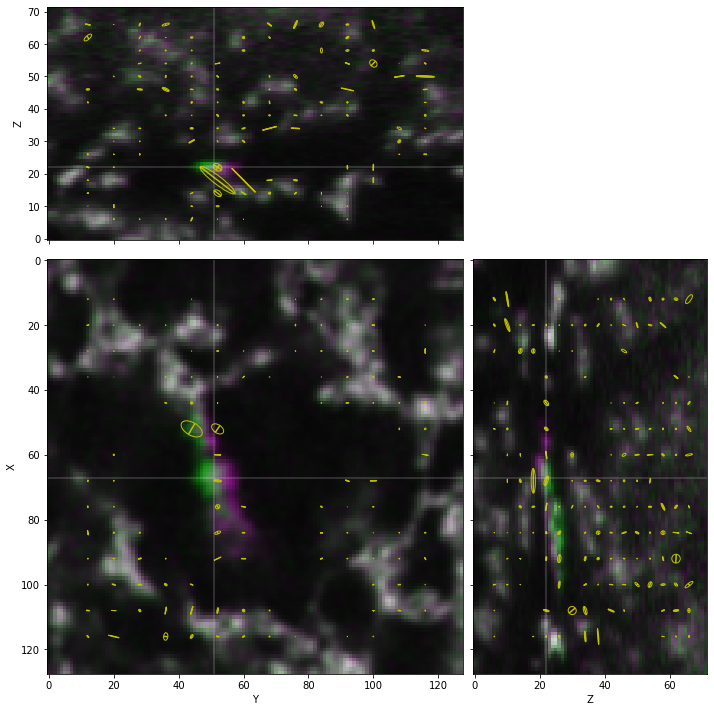

In [201]:
#geometric texture evolution (absolute)
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1],ims[0].shape[0]], 
        'height_ratios':[ims[0].shape[0],ims[0].shape[1]]
    }
)
points = goodpoints
bonds = pairs
Z = 22
Y = 51
X = 67
scale=10
vmax=100
Nmin = 0

Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
Mtot1, Ntot1 = bin_texture(points[0]*px[::-1], bonds[1], grid, points_per_bond=2)
mask = Ntot>Nmin
#bin changes between the two frames
Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

#from sums to averages
Ntot_nz = 1/np.maximum(1, Ntot)

## matrices
### texture, in length**2
M = Mtot * Ntot_nz[...,None]
### geometrical changes, in length**2/time (probably px**2*fps)
C = 2 * Ctot * Ntot_nz[...,None, None]
B = C2B(C)
### topological changes, in length**2/time (probably px**2*fps)
T = 2 * Ttot * Ntot_nz[...,None]

axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
display_matrices(axs[1,0], gridYX, (B*mask[...,None])[Z//zradius-1, ...,3:], scale=scale, col='y')


axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
display_matrices(axs[0,0], gridYZ, (B*mask[...,None])[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
axs[0,0].invert_yaxis()

axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
display_matrices(axs[1,1], gridZX, (B*mask[...,None])[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')

axs[0,1].set_visible(False)
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')
axs[0,0].set_ylabel('Z')
axs[1,1].set_xlabel('Z')
plt.tight_layout()

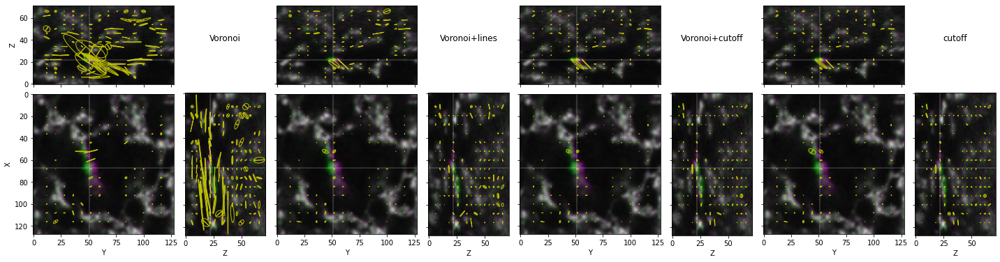

In [243]:
#geometric texture evolution (absolute) for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=100
scale=10
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    Mtot1, Ntot1 = bin_texture(points[0]*px[::-1], bonds[1], grid, points_per_bond=2)
    mask = Ntot>Nmin
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    B = C2B(C)

    axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,0], gridYX, B[Z//zradius-1, ...,3:], scale=scale, col='y')
    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    axs[1,0].set_xlabel('Y')

    axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[0,0], gridYZ, B[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)

    axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,1], gridZX, B[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')
    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    axs[1,1].set_xlabel('Z')
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[0,0].invert_yaxis()
plt.tight_layout()

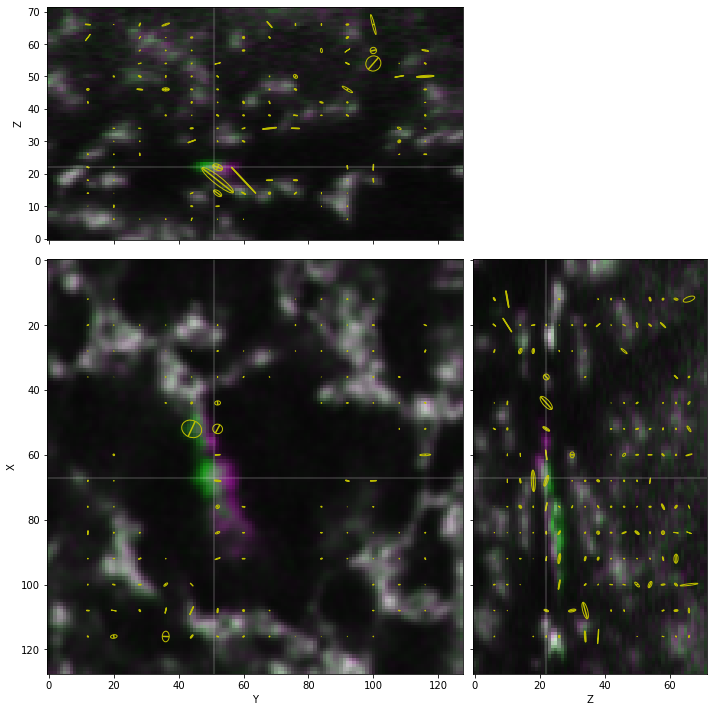

In [248]:
#geometric texture evolution (relative)
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1],ims[0].shape[0]], 
        'height_ratios':[ims[0].shape[0],ims[0].shape[1]]
    }
)
points = goodpoints
bonds = pairs
Z = 22
Y = 51
X = 67
scale=20
vmax=100


Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
#bin changes between the two frames
Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

#from sums to averages
Ntot_nz = 1/np.maximum(1, Ntot)

## matrices
### texture, in length**2
M = Mtot * Ntot_nz[...,None]
### geometrical changes, in length**2/time (probably px**2*fps)
C = 2 * Ctot * Ntot_nz[...,None, None]
B = C2B(C)
### topological changes, in length**2/time (probably px**2*fps)
T = 2 * Ttot * Ntot_nz[...,None]

## densities
### appearing bonds, in 1/time (probably fps)
na = 2 * Na_tot * Ntot_nz
### disappearing bonds, in 1/time (probably fps)
nd = 2 * Nd_tot * Ntot_nz
### conserved bonds, in 1/time (probably fps)
nc = 2 * Nc_tot * Ntot_nz

# link to continuous mechanics
V, Omega, P = statistical_relative_deformations(M, C, T)

axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
display_matrices(axs[1,0], gridYX, V[Z//zradius-1, ...,3:], scale=scale, col='y')


axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
display_matrices(axs[0,0], gridYZ, V[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
axs[0,0].invert_yaxis()

axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
display_matrices(axs[1,1], gridZX, V[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')

axs[0,1].set_visible(False)
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')
axs[0,0].set_ylabel('Z')
axs[1,1].set_xlabel('Z')
plt.tight_layout()

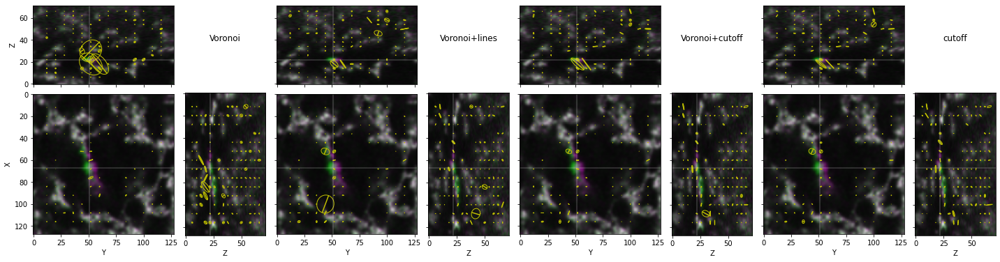

In [247]:
#geometric texture evolution (relative) for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=100
scale=20
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    Mtot1, Ntot1 = bin_texture(points[0]*px[::-1], bonds[1], grid, points_per_bond=2)
    mask = Ntot>Nmin
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)

    axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,0], gridYX, V[Z//zradius-1, ...,3:], scale=scale, col='y')
    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    axs[1,0].set_xlabel('Y')

    axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[0,0], gridYZ, V[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)

    axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,1], gridZX, V[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')
    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    axs[1,1].set_xlabel('Z')
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[0,0].invert_yaxis()
plt.tight_layout()
plt.savefig('discreet_Graner_V_definitions.png')

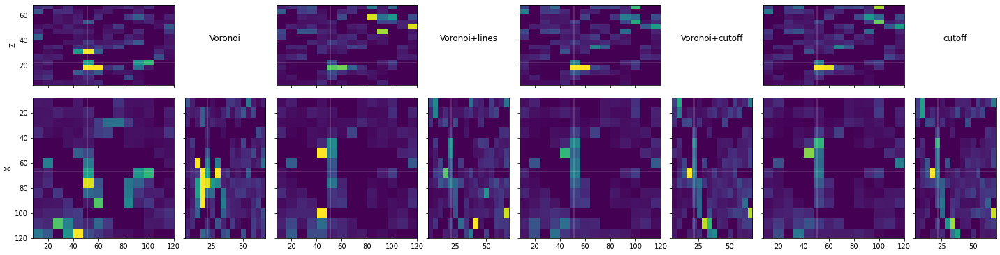

In [300]:
#norm of geometric texture evolution (relative) for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=1
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)
    normV = 2*np.linalg.norm(V, axis=-1) #* (Ntot>10)

    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    display2Dcount(axs[1,0], gridYX, normV[Z//zradius-1], vmin=0, vmax=vmax)

    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)
    display2Dcount(axs[0,0], gridYZ, normV[:,:,X//radius-1].T, vmin=0, vmax=vmax)

    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    display2Dcount(axs[1,1], gridZX, normV[:,Y//radius-1], vmin=0, vmax=vmax)
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[1,0].invert_yaxis()
plt.tight_layout()
plt.savefig('discreet_Graner_normV_definitions.png')

In [251]:
normV.max()

1.3467343713437643

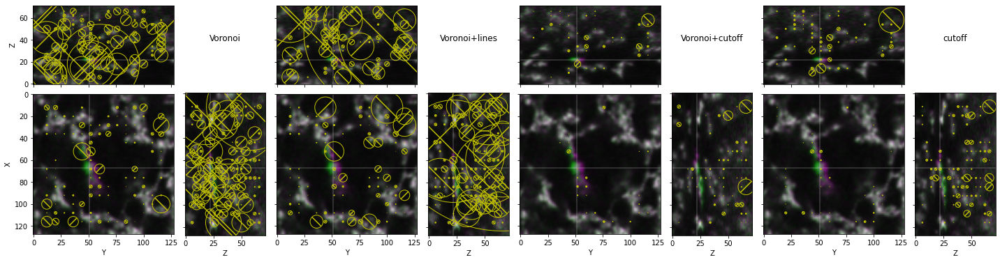

In [298]:
#topological texture evolution (relative) for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=100
scale=100
Nmin = 10
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    Mtot1, Ntot1 = bin_texture(points[0]*px[::-1], bonds[1], grid, points_per_bond=2)
    mask = (Ntot>Nmin)[...,None]
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)

    axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,0], gridYX, (P*mask)[Z//zradius-1, ...,3:], scale=scale, col='y')
    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    axs[1,0].set_xlabel('Y')

    axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[0,0], gridYZ, (P*mask)[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)
    
    axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
    display_matrices(axs[1,1], gridZX, (P*mask)[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')
    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    axs[1,1].set_xlabel('Z')
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[0,0].invert_yaxis()
plt.tight_layout()
plt.savefig('discreet_Graner_P_definitions.png')

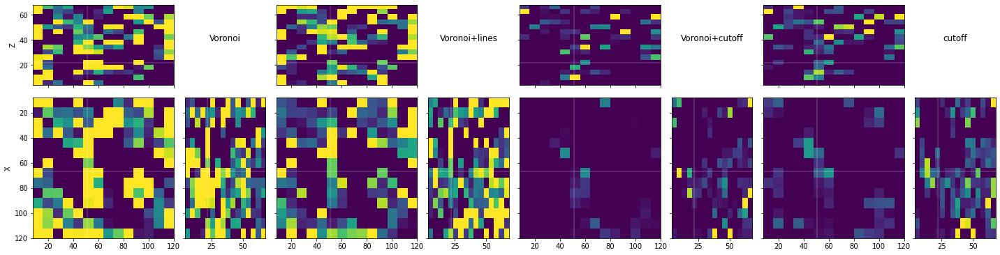

In [303]:
#norm of geometric texture evolution (relative) for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=0.2
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)
    normP = 2*np.linalg.norm(P, axis=-1) #* (Ntot>10)

    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    display2Dcount(axs[1,0], gridYX, normP[Z//zradius-1], vmin=0, vmax=vmax)

    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)
    display2Dcount(axs[0,0], gridYZ, normP[:,:,X//radius-1].T, vmin=0, vmax=vmax)

    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    display2Dcount(axs[1,1], gridZX, normP[:,Y//radius-1], vmin=0, vmax=vmax)
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[1,0].invert_yaxis()
plt.tight_layout()
plt.savefig('discreet_Graner_normP_definitions.png')

Voronoi+lines creates large topological changes that are not found with other network definitions, except sometimes Voronoi. Not all of these changes are filtered out by removing low count boxes.

For distance-based network definitions, the topological signal near interesting zones is small (~1%)

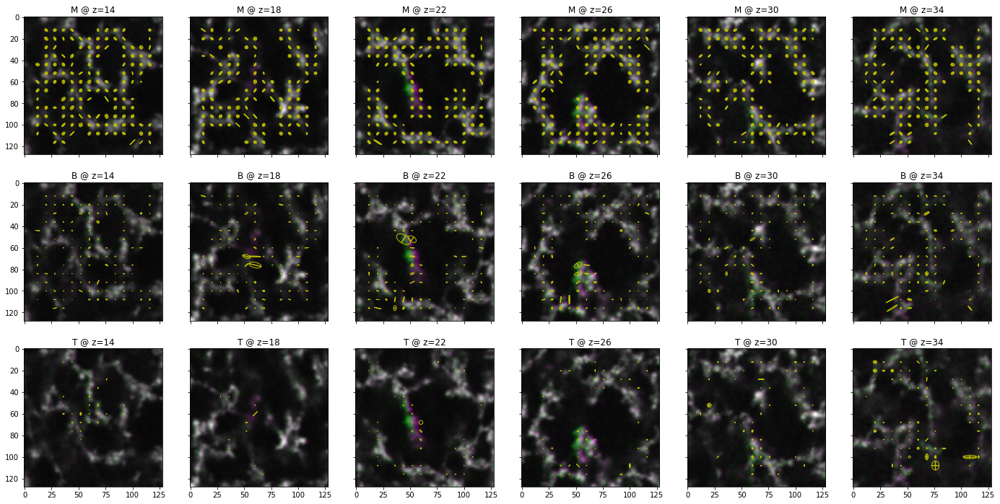

In [232]:
#texture evolution (absolute)
notempty = Ntot>1
fig, axs = plt.subplots(3,6, figsize=(24,12), subplot_kw={'aspect': 'equal'}, sharex=True, sharey=True)

for row, F, label, scale in zip(axs, [M,B,T], ['M','B','T'], [2,20,2]):
    for ax, z in zip(row, range(Z-2*zradius, Z+4*zradius, zradius)):
        ax.imshow(np.dstack([im[z].T for im in ims])[...,[0,1,0]], "gray")
        display_matrices(ax, gridYX, (F*notempty[...,None])[z//zradius-1, ...,3:], scale=scale, col='y')
        ax.set_title(f'{label} @ z={z:02d}')
        

$\Omega$ is a a skew-symmetric matrix (anti-symmetric)
$$\Omega = \left(\begin{array}{ccc}
0 &-u_x &u_y\\
u_x&0 &-u_z\\
-u_y&u_z&0\\
\end{array}\right)$$

The axis of rotation can be expressed as $$\vec{u} = \left(\begin{array}{c}u_z\\u_y\\u_x\end{array}\right)$$

The angle of rotation is $\omega$ with $\|u\| = 2\sin\omega$. That is $\sin\omega = \sqrt{u_x^2+u_y^2+u_z^2}$.

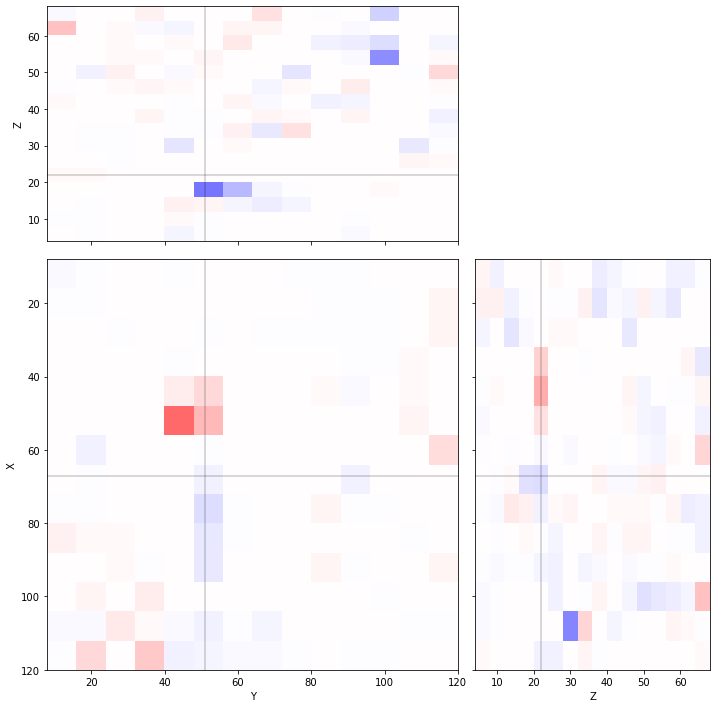

In [259]:
#rotational rate (projected)
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius], 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
bonds = pairs
Z = 22
Y = 51
X = 67
scale=10
vmax=1

lc = (0,0,0,0.2)

Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
#bin changes between the two frames
Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

#from sums to averages
Ntot_nz = 1/np.maximum(1, Ntot)

## matrices
### texture, in length**2
M = Mtot * Ntot_nz[...,None]
### geometrical changes, in length**2/time (probably px**2*fps)
C = 2 * Ctot * Ntot_nz[...,None, None]
#B = C2B(C)
### topological changes, in length**2/time (probably px**2*fps)
T = 2 * Ttot * Ntot_nz[...,None]

# link to continuous mechanics
V, Omega, P = statistical_relative_deformations(M, C, T)

#axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
display2Dcount(axs[1,0], gridYX, -Omega[Z//zradius-1,..., -1], cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
#display_matrices(axs[1,0], gridYX, V[Z//zradius-1, ...,3:], scale=scale, col='y')


#axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
display2Dcount(axs[0,0], gridYZ, -Omega[:,:,X//radius-1,..., 0].T, cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
#display_matrices(axs[0,0], gridYZ, V[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
#axs[0,0].invert_yaxis()

#axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
display2Dcount(axs[1,1], gridZX, Omega[:,Y//radius-1,...,1], cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
#display_matrices(axs[1,1], gridZX, V[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')

axs[0,1].set_visible(False)
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')
axs[0,0].set_ylabel('Z')
axs[1,1].set_xlabel('Z')
axs[1,0].invert_yaxis()
plt.tight_layout()

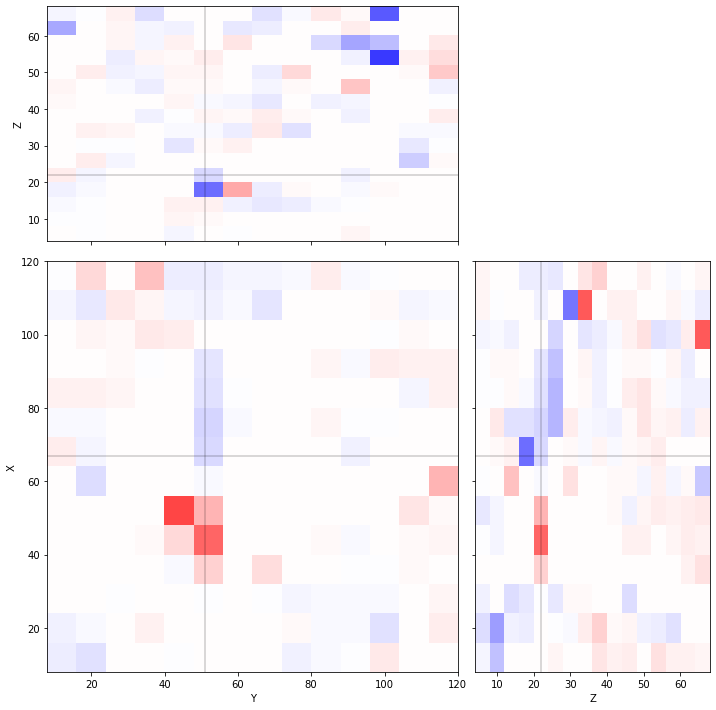

In [260]:
#rotational rate (norm)
fig, axs = plt.subplots(
    2,2, figsize=(10,10), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius], 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
bonds = pairs
Z = 22
Y = 51
X = 67
scale=10
vmax=1

lc = (0,0,0,0.2)

Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
#bin changes between the two frames
Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

#from sums to averages
Ntot_nz = 1/np.maximum(1, Ntot)

## matrices
### texture, in length**2
M = Mtot * Ntot_nz[...,None]
### geometrical changes, in length**2/time (probably px**2*fps)
C = 2 * Ctot * Ntot_nz[...,None, None]
#B = C2B(C)
### topological changes, in length**2/time (probably px**2*fps)
T = 2 * Ttot * Ntot_nz[...,None]

# link to continuous mechanics
V, Omega, P = statistical_relative_deformations(M, C, T)
normOmega = np.sign(-Omega[...,-1])*np.linalg.norm(Omega, axis=-1)

#axs[1,0].imshow(np.dstack([im[Z].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,0].axhline(X, color=lc)
axs[1,0].axvline(Y, color=lc)
display2Dcount(axs[1,0], gridYX, normOmega[Z//zradius-1], cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
#display_matrices(axs[1,0], gridYX, V[Z//zradius-1, ...,3:], scale=scale, col='y')


#axs[0,0].imshow(np.dstack([im[:,:,X] for im in ims])[...,[0,1,0]], 'gray')
axs[0,0].axhline(Z, color=lc)
axs[0,0].axvline(Y, color=lc)
display2Dcount(axs[0,0], gridYZ, normOmega[:,:,X//radius-1].T, cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
#display_matrices(axs[0,0], gridYZ, V[:,:,X//radius-1, ...,[0,1,3]].T, scale=scale, col='y')
#axs[0,0].invert_yaxis()

#axs[1,1].imshow(np.dstack([im[:,Y].T for im in ims])[...,[0,1,0]], 'gray')
axs[1,1].axhline(X, color=lc)
axs[1,1].axvline(Z, color=lc)
display2Dcount(axs[1,1], gridZX, normOmega[:,Y//radius-1], cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
#display_matrices(axs[1,1], gridZX, V[:,Y//radius-1][...,[5,2,0]], scale=scale, col='y')

axs[0,1].set_visible(False)
axs[1,0].set_xlabel('Y')
axs[1,0].set_ylabel('X')
axs[0,0].set_ylabel('Z')
axs[1,1].set_xlabel('Z')
axs_all[1,0].invert_yaxis()
plt.tight_layout()

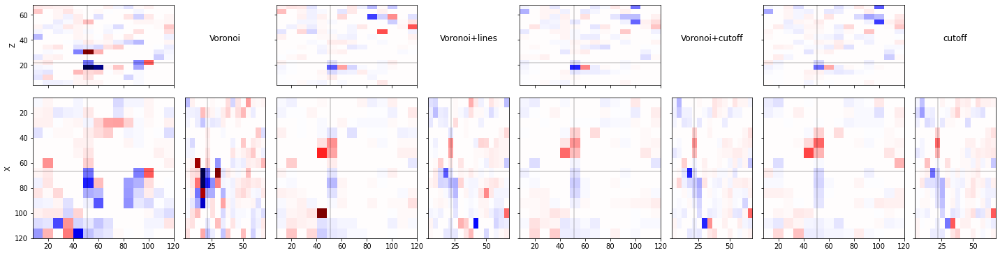

In [261]:
#rotational rate (sign_z*norm), for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=1
lc = (0,0,0,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)
    normOmega = np.sign(-Omega[...,-1])*np.linalg.norm(Omega, axis=-1)

    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    display2Dcount(axs[1,0], gridYX, normOmega[Z//zradius-1], cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)

    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)
    display2Dcount(axs[0,0], gridYZ, normOmega[:,:,X//radius-1].T, cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)

    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    display2Dcount(axs[1,1], gridZX, normOmega[:,Y//radius-1], cmap=plt.cm.seismic, vmin=-vmax, vmax=vmax)
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[1,0].invert_yaxis()
plt.tight_layout()
plt.savefig('discreet_Graner_normOmega_definitions.png')

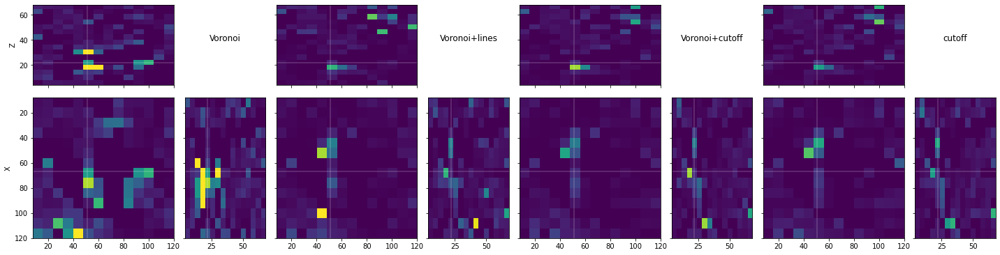

In [266]:
#rotational rate (norm), for various choices of connectivity
fig, axs_all = plt.subplots(
    2,8, figsize=(20,5.3), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=0.5
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    axs = axs_all[:,2*i:2*(i+1)]
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]

    # link to continuous mechanics
    V, Omega, P = statistical_relative_deformations(M, C, T)
    normOmega = np.linalg.norm(Omega, axis=-1) #* (Ntot>10)

    axs[1,0].axhline(X, color=lc)
    axs[1,0].axvline(Y, color=lc)
    display2Dcount(axs[1,0], gridYX, normOmega[Z//zradius-1], vmin=0, vmax=vmax)

    axs[0,0].axhline(Z, color=lc)
    axs[0,0].axvline(Y, color=lc)
    display2Dcount(axs[0,0], gridYZ, normOmega[:,:,X//radius-1].T, vmin=0, vmax=vmax)

    axs[1,1].axhline(X, color=lc)
    axs[1,1].axvline(Z, color=lc)
    display2Dcount(axs[1,1], gridZX, normOmega[:,Y//radius-1], vmin=0, vmax=vmax)
    
    axs[0,1].set_axis_off()#set_visible(False)
    axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[1,0].invert_yaxis()
plt.tight_layout()
plt.savefig('discreet_Graner_normOmega_definitions.png')

In [240]:
normOmega.max(), vmax

(0.6612400377258073, 0.6666666666666666)

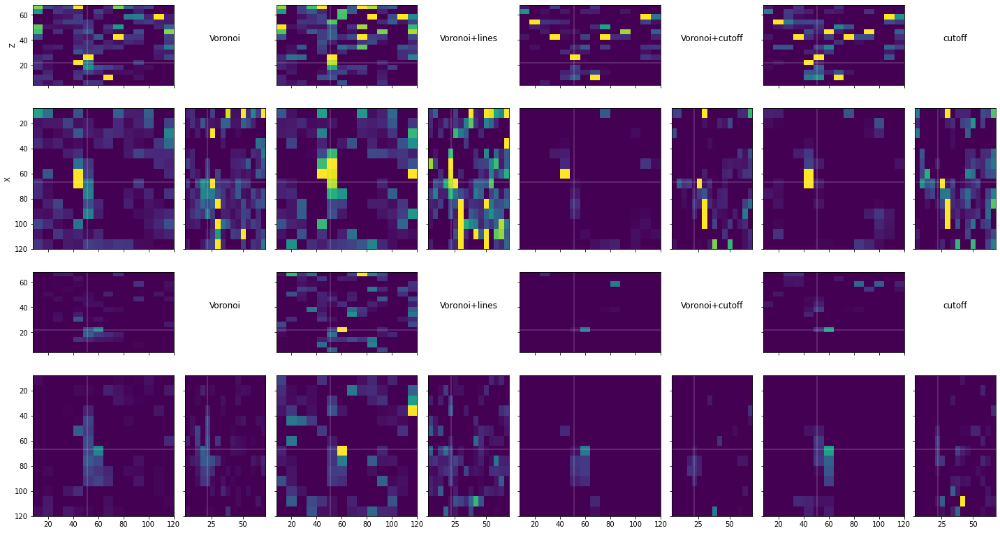

In [308]:
#density of appearing/disappearing bonds for various choices of connectivity
fig, axs_all = plt.subplots(
    4,8, figsize=(20,11), sharex='col', sharey='row', 
    subplot_kw={'aspect': 'equal'}, 
    gridspec_kw={
        'width_ratios':[ims[0].shape[1]-2*radius,ims[0].shape[0]-2*zradius]*4, 
        'height_ratios':[ims[0].shape[0]-2*zradius,ims[0].shape[1]-2*radius]*2
    }
)
points = goodpoints
Z = 22
Y = 51
X = 67
vmax=1
lc = (1,1,1,0.2)
for i, (bonds, title) in enumerate(zip([edges, lines, short_edges, pairs], ["Voronoi", "Voronoi+lines", "Voronoi+cutoff", "cutoff"])):
    
    Mtot, Ntot = bin_texture(points[0]*px[::-1], bonds[0], grid, points_per_bond=2)
    #bin changes between the two frames
    Ctot, Nc_tot, Ttot, Na_tot, Nd_tot = bin_changes(points[0]*px[::-1], points[1]*px[::-1], bonds[0], bonds[1], grid, points_per_bond=2)

    #from sums to averages
    Ntot_nz = 1/np.maximum(1, Ntot)

    ## matrices
    ### texture, in length**2
    M = Mtot * Ntot_nz[...,None]
    ### geometrical changes, in length**2/time (probably px**2*fps)
    C = 2 * Ctot * Ntot_nz[...,None, None]
    #B = C2B(C)
    ### topological changes, in length**2/time (probably px**2*fps)
    T = 2 * Ttot * Ntot_nz[...,None]
    
    ## densities
    ### apprearing bonds, in 1/time (probably fps)
    na = 2 * Na_tot * Ntot_nz
    ### disapprearing bonds, in 1/time (probably fps)
    nd = 2 * Nd_tot * Ntot_nz
    ### conserved bonds, in 1/time (probably fps)
    nc = 2 * Nc_tot * Ntot_nz
    
    for j, n in enumerate([na, nd]):
        axs = axs_all[2*j:2*(j+1):,2*i:2*(i+1)]

        axs[1,0].axhline(X, color=lc)
        axs[1,0].axvline(Y, color=lc)
        display2Dcount(axs[1,0], gridYX, n[Z//zradius-1], vmin=0, vmax=vmax)

        axs[0,0].axhline(Z, color=lc)
        axs[0,0].axvline(Y, color=lc)
        display2Dcount(axs[0,0], gridYZ, n[:,:,X//radius-1].T, vmin=0, vmax=vmax)

        axs[1,1].axhline(X, color=lc)
        axs[1,1].axvline(Z, color=lc)
        display2Dcount(axs[1,1], gridZX, n[:,Y//radius-1], vmin=0, vmax=vmax)

        axs[0,1].set_axis_off()#set_visible(False)
        axs[0,1].set_title(title, y=0.5)
    
axs_all[1,0].set_ylabel('X')
axs_all[0,0].set_ylabel('Z')
axs_all[1,0].invert_yaxis()
axs_all[3,0].invert_yaxis()
plt.tight_layout()
#plt.savefig('discreet_Graner_normP_definitions.png')

In [267]:
pwd

'/data/mleocmach/Documents/Akash/20200221/20200221_3'